In [1]:
import scanpy as sc
import numpy as np
import anndata
import scanpy as sc
import igraph
import ALLCools
from ALLCools.integration.seurat_class import SeuratIntegration
import scanpy._utils as sc_utils 
import networkx as nx
import metis
import pandas as pd
import matplotlib.pyplot as plt
import scipy.sparse
import os
from scipy.stats import zscore
import seaborn as sns 

In [2]:
NR1_2= sc.read_h5ad('/mnt/f/spatial/NR1_2.h5ad')

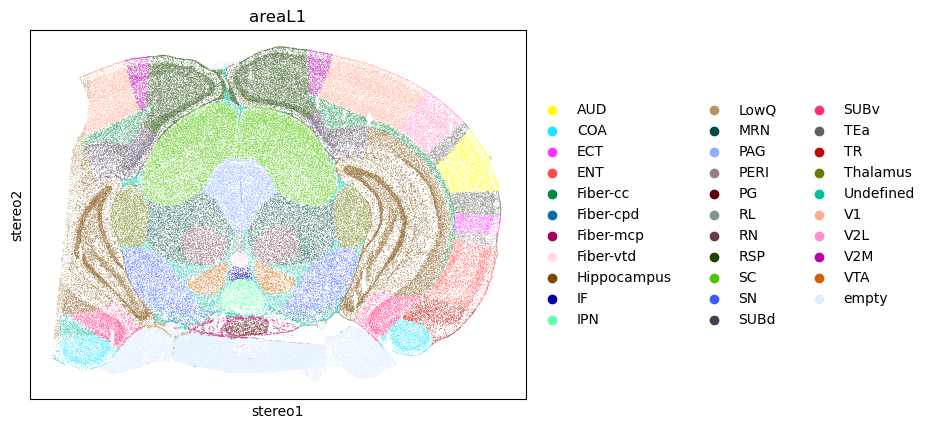

In [3]:
sc.pl.embedding(NR1_2, basis='stereo',color='areaL1')

In [4]:
NR1_2_HIP = NR1_2[NR1_2.obs['areaL1']=='Hippocampus']

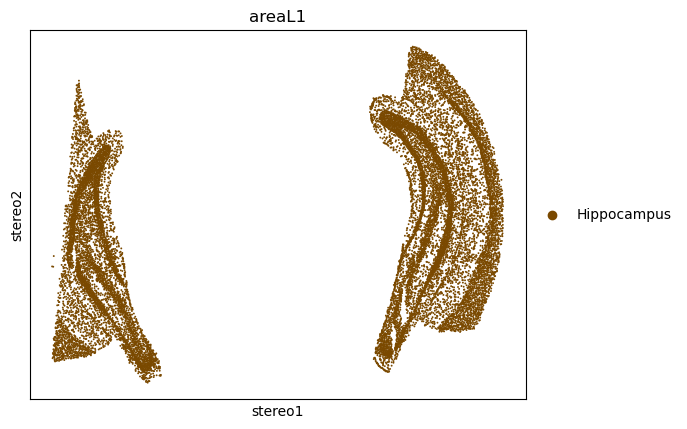

In [5]:
sc.pl.embedding(NR1_2_HIP, basis='stereo',color='areaL1')

In [6]:
NR1_2_HIPR = NR1_2_HIP[NR1_2_HIP.obs['left_right']=='right']

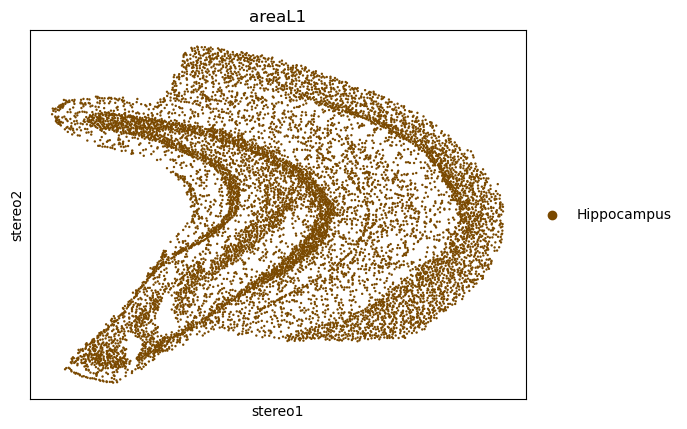

In [7]:
sc.pl.embedding(NR1_2_HIPR, basis='stereo',color='areaL1')

In [8]:
N_HIP_Sn = sc.read_h5ad('/mnt/f/spatial/HIP/NR_HIP_ann_filter.h5ad')

In [86]:
N_HIP_Sn_DG = N_HIP_Sn[N_HIP_Sn.obs['Subclass']=='DG Glut']

In [88]:
N_HIP_Sn_DG

View of AnnData object with n_obs × n_vars = 4979 × 21122
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Sample', 'Class', 'Subclass', 'Subtype', 'Ann_subclass_cell', 'Type', 'New_Type', 'integration_partition'
    var: 'gene_ids', 'feature_types', 'n_cells-HIP_1', 'highly_variable-HIP_1', 'means-HIP_1', 'dispersions-HIP_1', 'dispersions_norm-HIP_1', 'n_cells-HIP_2', 'highly_variable-HIP_2', 'means-HIP_2', 'dispersions-HIP_2', 'dispersions_norm-HIP_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Class_colors', 'Sample_colors', 'Subclass_colors', 'Type_colors', 'dendrogram_leiden_res_1.50', 'hvg', 'leiden_res_0.80', 'leiden_res_0.80_colors', 'leiden_res_1.00', 'leiden_res_1.00_colors', 'leiden_res_1.50', 'leiden_res_1.50_colors', 'neighbors', 'pca', 'umap', 'log1p'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

/root/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


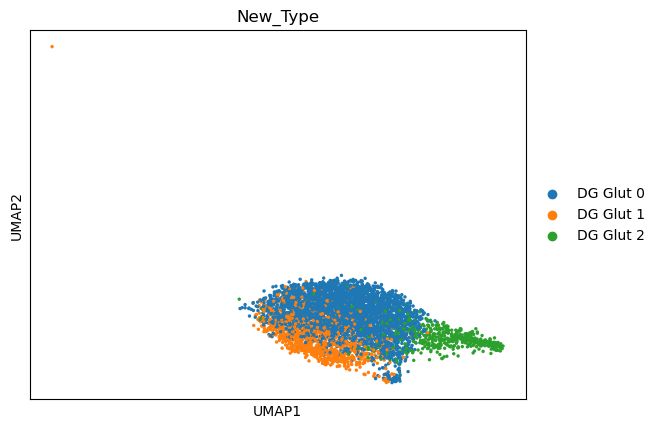

In [89]:
sc.pl.umap(N_HIP_Sn_DG,color='New_Type')

In [9]:
# Consider the common genes
common_genes = np.array(N_HIP_Sn.var_names.intersection(NR1_2_HIPR.var_names))

In [10]:
def get_sparse_from_igraph(graph, weight_attr=None):
    from scipy.sparse import csr_matrix

    edges = graph.get_edgelist()
    if weight_attr is None:
        weights = [1] * len(edges)
    else:
        weights = graph.es[weight_attr]
    if not graph.is_directed():
        edges.extend([(v, u) for u, v in edges])
        weights.extend(weights)
    shape = graph.vcount()
    shape = (shape, shape)
    if len(edges) > 0:
        return csr_matrix((weights, zip(*edges)), shape=shape)
    else:
        return csr_matrix(shape)

In [11]:
def partition_subclasses(adata, n_partitions):
    '''Assign integration partitions as the adata.obs['integration_partion'] column.'''
    adata.obs['integration_partition'] = 'p0'
    
    # Get a sparse matrix of that counts edges between subclasses
    ones = adata.obsp['distances'].copy()
    ones.data = np.ones(len(ones.data))

    g_neighobrs = sc._utils.get_igraph_from_adjacency(ones, directed=True)
    vc = igraph.VertexClustering(g_neighobrs, membership=adata.obs['Subclass'].cat.codes.values)
    cluster_mtx = get_sparse_from_igraph(vc.cluster_graph(combine_edges='sum'), weight_attr='weight')
    
    # Partition the cluster level graph
    G_cluster = nx.from_scipy_sparse_array(cluster_mtx)
    for i in adata.obs['Subclass'].cat.codes.values:
        G_cluster.nodes[i]['weight'] = np.sum(adata.obs['Subclass'] 
                                              == adata.obs['Subclass'].cat.categories[i] )
    G_cluster.graph['node_weight_attr'] = 'weight'
    
    (cut, parts) = metis.part_graph(G_cluster, n_partitions, recursive=False,
                                   tpwgts=[1 / n_partitions] * n_partitions) 
    
    # Assign the partitions
    for i in range(len(parts)):
        mask = (adata.obs['Subclass'] == adata.obs['Subclass'].cat.categories[i])
        adata.obs.loc[mask, 'integration_partition'] = 'p' + str(parts[i])
    
    adata.obs['integration_partition'] = adata.obs['integration_partition'].astype('category')
    
import scipy.sparse
def get_cluster_mean_expression_matrix(adata, cluster_column):
    '''Get a dataframe of mean gene expression of each cluster.'''
    if scipy.sparse.issparse(adata.X):
        X = adata.X.toarray()
    else:
        X = adata.X
   
    cell_exp_mtx = pd.DataFrame(X, index=adata.obs[cluster_column], columns=adata.var.index)    
    return cell_exp_mtx.groupby(by=cluster_column).mean()

def calculate_correlation_matrix(adata, cluster_column):
    '''Calculate gene expression correlations between clusters.'''
    cluster_mean_exp = get_cluster_mean_expression_matrix(adata, cluster_column)
    
    # Initialzie the correlation matrix
    cluster_ids = np.array(cluster_mean_exp.index)
    N_clusters = len(cluster_ids)
    correlation_mtx = pd.DataFrame(np.ones((N_clusters, N_clusters)), index=cluster_ids, columns=cluster_ids)
    
    # Fill the correlation matrix
    for i in range(N_clusters):
        cluster_id1 = cluster_ids[i]
        mean_exps1 = np.array(cluster_mean_exp.loc[cluster_id1])
        
        for j in range(i + 1, N_clusters):
            cluster_id2 = cluster_ids[j]
            mean_exps2 = np.array(cluster_mean_exp.loc[cluster_id2])
            
            r, p = scipy.stats.pearsonr(mean_exps1, mean_exps2)

            correlation_mtx.loc[cluster_id1, cluster_id2] = r
            correlation_mtx.loc[cluster_id2, cluster_id1] = r
            
    return correlation_mtx

def merge_clusters(obs_df, cluster_col, clusters_to_merge):
    merged_cluster_id = sorted(clusters_to_merge)[0]
    obs_df[cluster_col][obs_df[cluster_col].isin(clusters_to_merge)] = merged_cluster_id
    obs_df[cluster_col] = obs_df[cluster_col].cat.remove_unused_categories()

In [12]:
%%time
# Define the integration partitions using the sequencing data
n_partitions = 100

# 标准化并检查数据
sc.pp.normalize_total(N_HIP_Sn, target_sum=1000)


# 对数转换并检查数据
sc.pp.log1p(N_HIP_Sn)


# 缩放并防止除以零的情况
sc.pp.scale(N_HIP_Sn, zero_center=False)


# PCA降维
n_pcs = 100
sc.tl.pca(N_HIP_Sn, svd_solver='arpack', n_comps=n_pcs)


# 计算neighbors
sc.pp.neighbors(N_HIP_Sn, use_rep='X_pca', n_neighbors=25, n_pcs=n_pcs)

# 分区并进行整合
partition_subclasses(N_HIP_Sn, n_partitions)

# 后续的分区合并和处理
partition_corr_df = calculate_correlation_matrix(N_HIP_Sn, 'integration_partition')
p_names, p_n_cells = np.unique(N_HIP_Sn.obs['integration_partition'], return_counts=True)
p_smalls = p_names[p_n_cells < 10000]
p_larges = p_names[p_n_cells >= 10000]
partition_corr_df = partition_corr_df.loc[p_smalls, p_larges]

for p1 in p_smalls:
    # 检查 partition_corr_df.loc[p1] 是否为空
    if partition_corr_df.loc[p1].empty:
        print(f"Warning: partition {p1} has no corresponding large partition.")
        continue  # 跳过这个空的序列
    
    # 继续进行合并
    p2 = partition_corr_df.columns[np.argmax(partition_corr_df.loc[p1])]
    print(f'Merge partitions {p1} and {p2}')
    merge_clusters(N_HIP_Sn.obs, 'integration_partition', [p1, p2])

seq_annotation_df = N_HIP_Sn.obs.copy()


/tmp/ipykernel_100517/4169816286.py:39: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return cell_exp_mtx.groupby(by=cluster_column).mean()


CPU times: user 1min 12s, sys: 2.89 s, total: 1min 15s
Wall time: 25.8 s


In [13]:
%%time
# Reload the sequencing data and assign the partitions
N_HIP_Sn.obs['integration_partition'] = seq_annotation_df['integration_partition']

N_HIP_Sn.obs['Subclass'] = N_HIP_Sn.obs['Subclass'].astype('category')
N_HIP_Sn.obs['Type'] = N_HIP_Sn.obs['Type'].astype('category')

N_HIP_Sn = N_HIP_Sn[~N_HIP_Sn.obs['Type'].isna()]
N_HIP_Sn = N_HIP_Sn[~N_HIP_Sn.obs['Subclass'].isna()]

CPU times: user 701 ms, sys: 62.8 ms, total: 764 ms
Wall time: 106 ms


In [14]:
%%time
# Split the sequencing data for the input of the final round of integration.
# Because imputation is done at this round, all genes are included.

partition_path = '/mnt/f/spatial/HIP/NR1_2/partitions/'

# 获取分区信息
partitions = N_HIP_Sn.obs['integration_partition'].cat.categories

print('Partition, N_cells, subclasses')

# 遍历每个分区
for pn in partitions:
    # 根据分区选择子集数据
    adata_subset = N_HIP_Sn[N_HIP_Sn.obs['integration_partition'] == pn]
    
    # 替换路径中的不合法字符并生成保存路径
    partition_save_path = partition_path + pn.replace('/', '-').replace(' ', '_') + '/'
    
    # 自动创建目标文件夹，如果不存在则创建
    os.makedirs(partition_save_path, exist_ok=True)
    
    # 将子集数据保存到 .h5ad 文件
    save_file = partition_save_path + 'adata_seq.h5ad'
    adata_subset.write_h5ad(save_file, compression='gzip')
    
    # 打印分区的统计信息
    print(f'{pn}, {adata_subset.shape[0]}, {list(np.unique(adata_subset.obs["Subclass"]))}')


Partition, N_cells, subclasses
p24, 4770, ['CA1-Pros Glut']
p49, 4979, ['DG Glut']
p52, 453, ['DG-PIR Ex IMN']
p55, 571, ['OPC']
p58, 460, ['SUB-Pros']
p60, 391, ['NP SUB Glut']
p61, 178, ['Microglia']
p64, 431, ['Lamp5 Lhx6 Gaba']
p67, 665, ['Sst Gaba']
p70, 604, ['RHP-COA Ndnd Gaba']
p71, 304, ['Pvalb']
p72, 43, ['Pvalb chandelier']
p74, 409, ['Astro']
p86, 3010, ['Oligo']
p99, 3211, ['CA3 Glut']
CPU times: user 13.8 s, sys: 240 ms, total: 14.1 s
Wall time: 21.4 s


In [15]:
# Merge the datasets
NR_HIP_merge = N_HIP_Sn.concatenate(NR1_2_HIPR,
                                    batch_categories=['seq', 'spatial'],
                                    batch_key='modality',
                                    index_unique=None,join='outer')

/tmp/ipykernel_100517/1404923631.py:2: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  NR_HIP_merge = N_HIP_Sn.concatenate(NR1_2_HIPR,
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


In [16]:
%%time
# Get the significant PCs
n_pcs = 10
sc.tl.pca(NR_HIP_merge, svd_solver='arpack', n_comps=n_pcs)

CPU times: user 33.5 s, sys: 500 ms, total: 34 s
Wall time: 3.06 s


In [17]:
NR_HIP_list = [NR_HIP_merge[NR_HIP_merge.obs['modality'] == 'seq'],
              NR_HIP_merge[NR_HIP_merge.obs['modality'] == 'spatial']]

In [18]:
%%time
# Find the integration anchors
integrator = SeuratIntegration()
integrator.find_anchor(NR_HIP_list,
                       k_local=None,
                       key_local='X_pca',
                       k_anchor=50,
                       key_anchor='X',
                       dim_red='cca',
                       max_cc_cells=100000,
                       k_score=100,
                       k_filter=None,
                       scale1=False,
                       scale2=False,
                       n_components=n_pcs,
                       n_features=200,
                       alignments=[[[0], [1]]])

Find anchors across datasets.
Run CCA
non zero dims 10
Find Anchors using k=100
Score Anchors
Identified 274958 anchors between datasets 0 and 1.
CPU times: user 7min 46s, sys: 18.6 s, total: 8min 5s
Wall time: 1min 2s


In [19]:
#label transfer
cell_type_col = 'integration_partition'

transfer_results = integrator.label_transfer(
    ref=[0],
    qry=[1],
    categorical_key=[cell_type_col],
    key_dist='X_pca',
    k_weight=100,
    npc=n_pcs)

integrator.save_transfer_results_to_adata(NR_HIP_merge, transfer_results)

Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer


In [20]:
# Assign the transfered labels and the confidence
NR1_2_HIPR.obs[cell_type_col + '_transfer'] = transfer_results[cell_type_col].idxmax(axis=1).astype('category')
NR1_2_HIPR.obs[cell_type_col + '_confidence'] = transfer_results[cell_type_col].max(axis=1)

n_transfered = len(np.unique(NR1_2_HIPR.obs[cell_type_col + '_transfer']))
n_total = len(np.unique(NR_HIP_merge.obs[cell_type_col + '_transfer']))
print(f'Transfered {n_transfered}/{n_total} cell types.')

Transfered 14/15 cell types.


/tmp/ipykernel_100517/2313207284.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  NR1_2_HIPR.obs[cell_type_col + '_transfer'] = transfer_results[cell_type_col].idxmax(axis=1).astype('category')


In [21]:
# Save the label transfer results for each class
partition_path = '/mnt/f/spatial/HIP/NR1_2/partitions/'


partitions = NR1_2_HIPR.obs[cell_type_col + '_transfer'].unique()

cell_type_col = 'integration_partition'

for pn in partitions:

    adata_subset =NR1_2_HIPR[NR1_2_HIPR.obs[cell_type_col + '_transfer'] == pn]
    

    partition_save_path = partition_path + pn.replace('/', '-').replace(' ', '_') + '/'
    

    if not os.path.exists(partition_save_path):
        os.makedirs(partition_save_path, exist_ok=True)
    

    save_file = partition_save_path + 'adata_spatial_integrated.h5ad'
    

    adata_subset.write_h5ad(save_file, compression='gzip')
    

    print(f'Successfully saved for partition {pn} at: {save_file}')

Successfully saved for partition p86 at: /mnt/f/spatial/HIP/NR1_2/partitions/p86/adata_spatial_integrated.h5ad
Successfully saved for partition p61 at: /mnt/f/spatial/HIP/NR1_2/partitions/p61/adata_spatial_integrated.h5ad
Successfully saved for partition p24 at: /mnt/f/spatial/HIP/NR1_2/partitions/p24/adata_spatial_integrated.h5ad
Successfully saved for partition p74 at: /mnt/f/spatial/HIP/NR1_2/partitions/p74/adata_spatial_integrated.h5ad
Successfully saved for partition p99 at: /mnt/f/spatial/HIP/NR1_2/partitions/p99/adata_spatial_integrated.h5ad
Successfully saved for partition p55 at: /mnt/f/spatial/HIP/NR1_2/partitions/p55/adata_spatial_integrated.h5ad
Successfully saved for partition p49 at: /mnt/f/spatial/HIP/NR1_2/partitions/p49/adata_spatial_integrated.h5ad
Successfully saved for partition p52 at: /mnt/f/spatial/HIP/NR1_2/partitions/p52/adata_spatial_integrated.h5ad
Successfully saved for partition p64 at: /mnt/f/spatial/HIP/NR1_2/partitions/p64/adata_spatial_integrated.h5ad
S

In [22]:
%%time
# Correct the PCs using the integration anchors
corrected = integrator.integrate(key_correct='X_pca',
                                 row_normalize=True,
                                 n_components=n_pcs,
                                 k_weight=100,
                                 sd=1,
                                 alignments=[[[0], [1]]])

NR_HIP_merge.obsm['X_pca_integrate'] = np.concatenate(corrected)

Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data
CPU times: user 18min 58s, sys: 2min 23s, total: 21min 21s
Wall time: 3min 5s


In [23]:
# Calculate KNN using the integrated PCs
sc.pp.neighbors(NR_HIP_merge,use_rep='X_pca_integrate')

In [40]:
Partition, N_cells, subclasses
p24, 4770, ['CA1-Pros Glut']
p49, 4979, ['DG Glut']
p52, 453, ['DG-PIR Ex IMN']
p55, 571, ['OPC']
p58, 460, ['SUB-Pros']
p60, 391, ['NP SUB Glut']
p61, 178, ['Microglia']
p64, 431, ['Lamp5 Lhx6 Gaba']
p67, 665, ['Sst Gaba']
p70, 604, ['RHP-COA Ndnd Gaba']
p71, 304, ['Pvalb']
p72, 43, ['Pvalb chandelier']
p74, 409, ['Astro']
p86, 3010, ['Oligo']
p99, 3211, ['CA3 Glut']

NameError: name 'Partition' is not defined

In [24]:
subclass_dict={'p52':'DG-PIR Ex IMN',
'p61': 'Microglia',
'p64': 'Lamp5 Lhx6 Gaba',
'p86': 'Oligo',
'p74': 'Astro',
'p99':'CA3 Glut',
'p72':'Pvalb chandelier',
'p67':'Sst Gaba',
'p60':'NP SUB Glut',
'p55':'OPC',
'p71':'Pvalb',
'p24':'CA1-Pros Glut',
'p70':'RHP-COA Ndnd Gaba',
'p49':'DG Glut',
'p58':'SUB-Pros'}

In [25]:
NR_HIP_merge.obs['integration_subclass_transfer'] = NR_HIP_merge.obs['integration_partition_transfer'].map(subclass_dict)
print(NR_HIP_merge.obs[['integration_partition_transfer', 'integration_subclass_transfer']])

                         integration_partition_transfer  \
AAACCCAAGAGATGCC-1-HIP_1                            p24   
AAACCCAAGTTGCATC-1-HIP_1                            p24   
AAACCCACAACCGCTG-1-HIP_1                            p49   
AAACCCACAGGAATCG-1-HIP_1                            p99   
AAACCCACATTCGGGC-1-HIP_1                            p99   
...                                                 ...   
111161                                              p24   
111189                                              p86   
111230                                              p74   
111232                                              p70   
111233                                              p74   

                         integration_subclass_transfer  
AAACCCAAGAGATGCC-1-HIP_1                 CA1-Pros Glut  
AAACCCAAGTTGCATC-1-HIP_1                 CA1-Pros Glut  
AAACCCACAACCGCTG-1-HIP_1                       DG Glut  
AAACCCACAGGAATCG-1-HIP_1                      CA3 Glut  
AAACCC

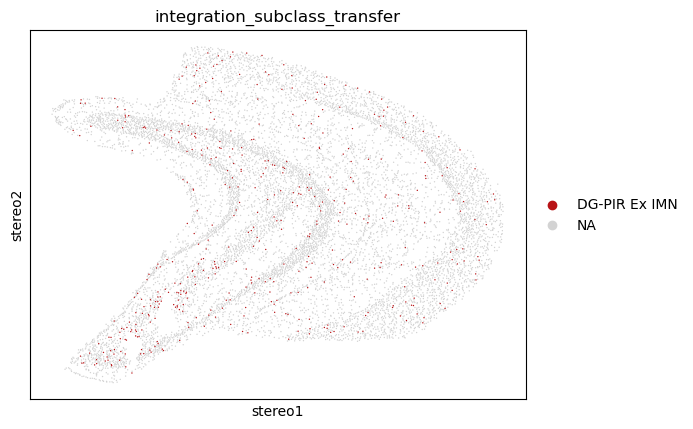

View of AnnData object with n_obs × n_vars = 457 × 27296
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Sample', 'Class', 'Subclass', 'Subtype', 'Ann_subclass_cell', 'Type', 'New_Type', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-HIP_1-seq', 'highly_variable-HIP_1-seq', 'means-HIP_1-seq', 'dispersions-HIP_1-seq', 'dispersions_norm-HIP_1-seq', 'n_cells-HIP_2-seq', 'highly_variable-HIP_2-seq', 'means-HIP_2-seq', 'dispersions-HIP_2-seq', 'dispersions_norm-HIP_2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'integration_subclass_transfer_colors'
    obsm: 'X_pca', 'X_umap', 'stereo', 'X_pca_integrate'
    varm: 'PCs'
    lay

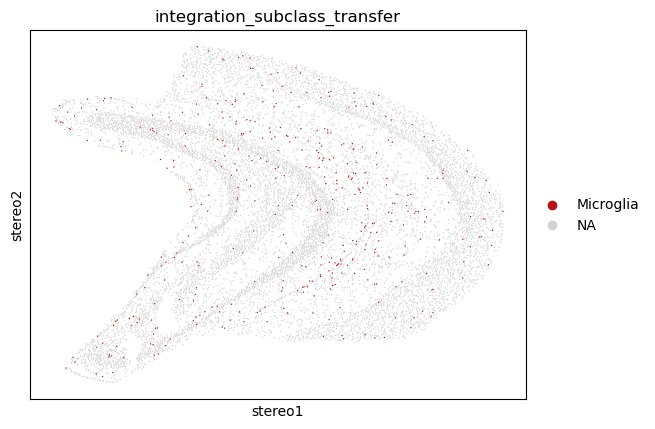

View of AnnData object with n_obs × n_vars = 421 × 27296
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Sample', 'Class', 'Subclass', 'Subtype', 'Ann_subclass_cell', 'Type', 'New_Type', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-HIP_1-seq', 'highly_variable-HIP_1-seq', 'means-HIP_1-seq', 'dispersions-HIP_1-seq', 'dispersions_norm-HIP_1-seq', 'n_cells-HIP_2-seq', 'highly_variable-HIP_2-seq', 'means-HIP_2-seq', 'dispersions-HIP_2-seq', 'dispersions_norm-HIP_2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'integration_subclass_transfer_colors'
    obsm: 'X_pca', 'X_umap', 'stereo', 'X_pca_integrate'
    varm: 'PCs'
    lay

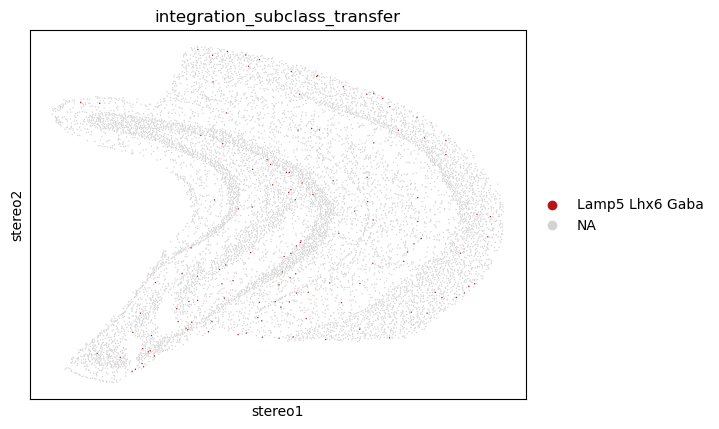

View of AnnData object with n_obs × n_vars = 130 × 27296
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Sample', 'Class', 'Subclass', 'Subtype', 'Ann_subclass_cell', 'Type', 'New_Type', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-HIP_1-seq', 'highly_variable-HIP_1-seq', 'means-HIP_1-seq', 'dispersions-HIP_1-seq', 'dispersions_norm-HIP_1-seq', 'n_cells-HIP_2-seq', 'highly_variable-HIP_2-seq', 'means-HIP_2-seq', 'dispersions-HIP_2-seq', 'dispersions_norm-HIP_2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'integration_subclass_transfer_colors'
    obsm: 'X_pca', 'X_umap', 'stereo', 'X_pca_integrate'
    varm: 'PCs'
    lay

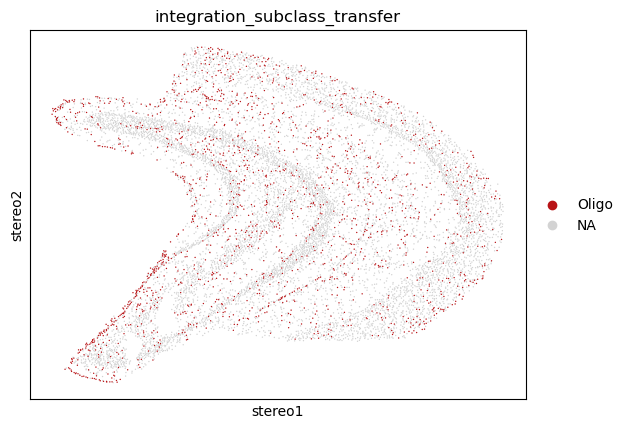

View of AnnData object with n_obs × n_vars = 1737 × 27296
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Sample', 'Class', 'Subclass', 'Subtype', 'Ann_subclass_cell', 'Type', 'New_Type', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-HIP_1-seq', 'highly_variable-HIP_1-seq', 'means-HIP_1-seq', 'dispersions-HIP_1-seq', 'dispersions_norm-HIP_1-seq', 'n_cells-HIP_2-seq', 'highly_variable-HIP_2-seq', 'means-HIP_2-seq', 'dispersions-HIP_2-seq', 'dispersions_norm-HIP_2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'integration_subclass_transfer_colors'
    obsm: 'X_pca', 'X_umap', 'stereo', 'X_pca_integrate'
    varm: 'PCs'
    la

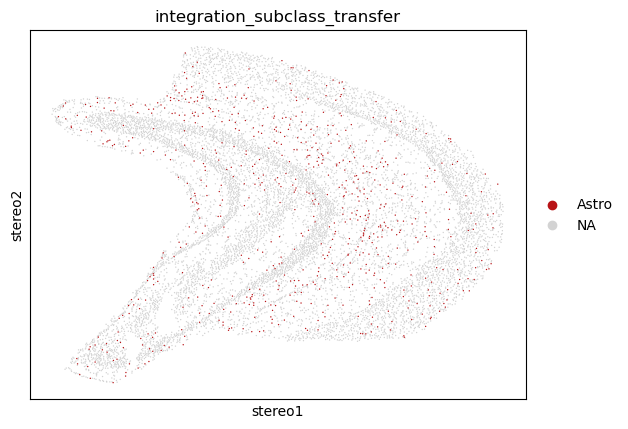

View of AnnData object with n_obs × n_vars = 695 × 27296
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Sample', 'Class', 'Subclass', 'Subtype', 'Ann_subclass_cell', 'Type', 'New_Type', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-HIP_1-seq', 'highly_variable-HIP_1-seq', 'means-HIP_1-seq', 'dispersions-HIP_1-seq', 'dispersions_norm-HIP_1-seq', 'n_cells-HIP_2-seq', 'highly_variable-HIP_2-seq', 'means-HIP_2-seq', 'dispersions-HIP_2-seq', 'dispersions_norm-HIP_2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'integration_subclass_transfer_colors'
    obsm: 'X_pca', 'X_umap', 'stereo', 'X_pca_integrate'
    varm: 'PCs'
    lay

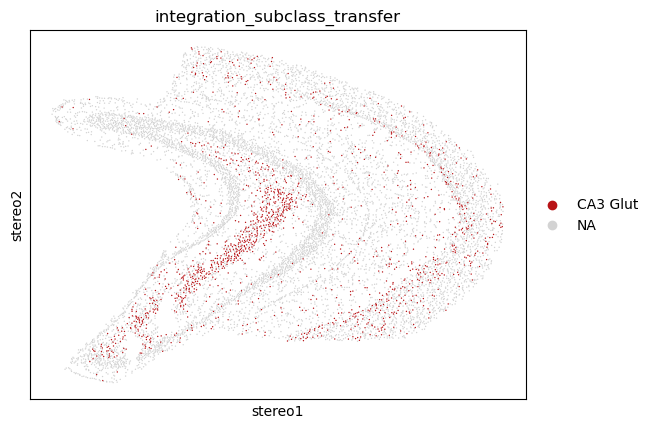

View of AnnData object with n_obs × n_vars = 1464 × 27296
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Sample', 'Class', 'Subclass', 'Subtype', 'Ann_subclass_cell', 'Type', 'New_Type', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-HIP_1-seq', 'highly_variable-HIP_1-seq', 'means-HIP_1-seq', 'dispersions-HIP_1-seq', 'dispersions_norm-HIP_1-seq', 'n_cells-HIP_2-seq', 'highly_variable-HIP_2-seq', 'means-HIP_2-seq', 'dispersions-HIP_2-seq', 'dispersions_norm-HIP_2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'integration_subclass_transfer_colors'
    obsm: 'X_pca', 'X_umap', 'stereo', 'X_pca_integrate'
    varm: 'PCs'
    la

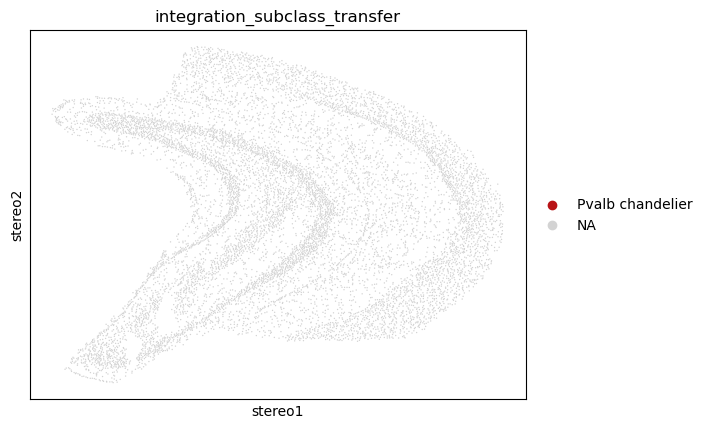

View of AnnData object with n_obs × n_vars = 0 × 27296
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Sample', 'Class', 'Subclass', 'Subtype', 'Ann_subclass_cell', 'Type', 'New_Type', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-HIP_1-seq', 'highly_variable-HIP_1-seq', 'means-HIP_1-seq', 'dispersions-HIP_1-seq', 'dispersions_norm-HIP_1-seq', 'n_cells-HIP_2-seq', 'highly_variable-HIP_2-seq', 'means-HIP_2-seq', 'dispersions-HIP_2-seq', 'dispersions_norm-HIP_2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'integration_subclass_transfer_colors'
    obsm: 'X_pca', 'X_umap', 'stereo', 'X_pca_integrate'
    varm: 'PCs'
    layer

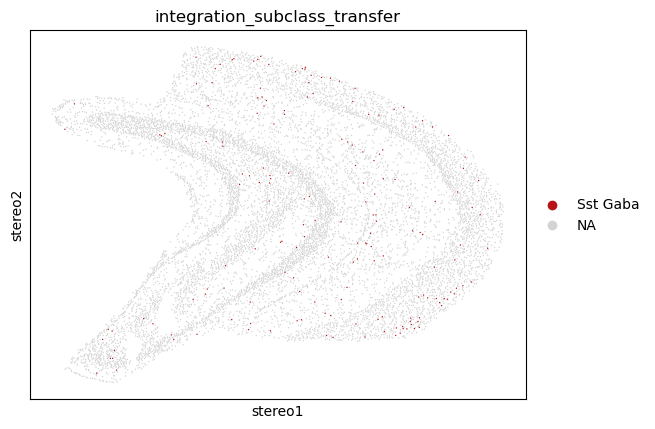

View of AnnData object with n_obs × n_vars = 177 × 27296
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Sample', 'Class', 'Subclass', 'Subtype', 'Ann_subclass_cell', 'Type', 'New_Type', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-HIP_1-seq', 'highly_variable-HIP_1-seq', 'means-HIP_1-seq', 'dispersions-HIP_1-seq', 'dispersions_norm-HIP_1-seq', 'n_cells-HIP_2-seq', 'highly_variable-HIP_2-seq', 'means-HIP_2-seq', 'dispersions-HIP_2-seq', 'dispersions_norm-HIP_2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'integration_subclass_transfer_colors'
    obsm: 'X_pca', 'X_umap', 'stereo', 'X_pca_integrate'
    varm: 'PCs'
    lay

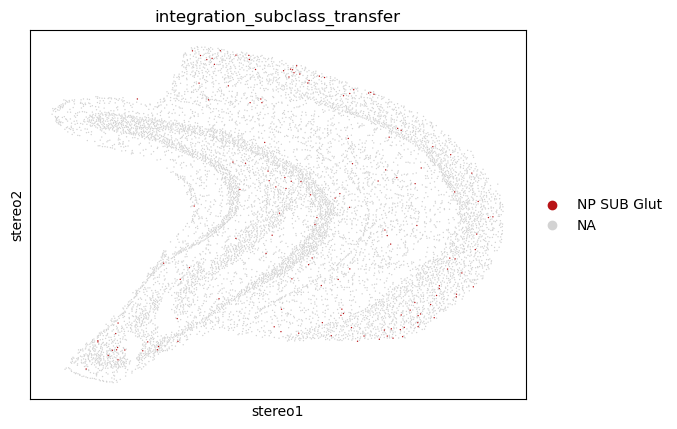

View of AnnData object with n_obs × n_vars = 145 × 27296
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Sample', 'Class', 'Subclass', 'Subtype', 'Ann_subclass_cell', 'Type', 'New_Type', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-HIP_1-seq', 'highly_variable-HIP_1-seq', 'means-HIP_1-seq', 'dispersions-HIP_1-seq', 'dispersions_norm-HIP_1-seq', 'n_cells-HIP_2-seq', 'highly_variable-HIP_2-seq', 'means-HIP_2-seq', 'dispersions-HIP_2-seq', 'dispersions_norm-HIP_2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'integration_subclass_transfer_colors'
    obsm: 'X_pca', 'X_umap', 'stereo', 'X_pca_integrate'
    varm: 'PCs'
    lay

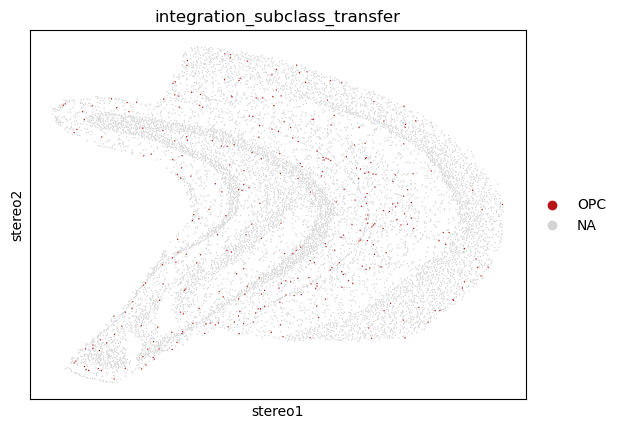

View of AnnData object with n_obs × n_vars = 329 × 27296
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Sample', 'Class', 'Subclass', 'Subtype', 'Ann_subclass_cell', 'Type', 'New_Type', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-HIP_1-seq', 'highly_variable-HIP_1-seq', 'means-HIP_1-seq', 'dispersions-HIP_1-seq', 'dispersions_norm-HIP_1-seq', 'n_cells-HIP_2-seq', 'highly_variable-HIP_2-seq', 'means-HIP_2-seq', 'dispersions-HIP_2-seq', 'dispersions_norm-HIP_2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'integration_subclass_transfer_colors'
    obsm: 'X_pca', 'X_umap', 'stereo', 'X_pca_integrate'
    varm: 'PCs'
    lay

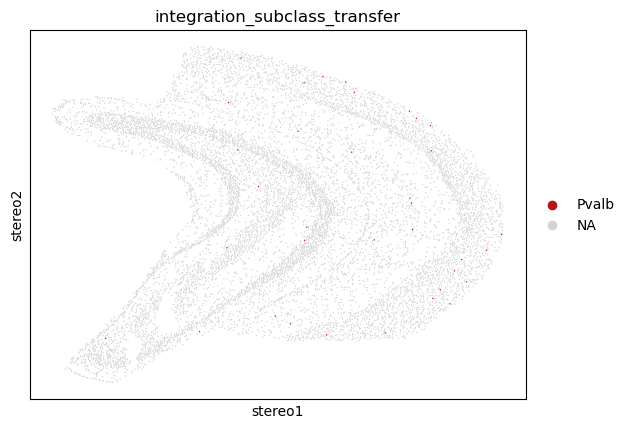

View of AnnData object with n_obs × n_vars = 35 × 27296
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Sample', 'Class', 'Subclass', 'Subtype', 'Ann_subclass_cell', 'Type', 'New_Type', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-HIP_1-seq', 'highly_variable-HIP_1-seq', 'means-HIP_1-seq', 'dispersions-HIP_1-seq', 'dispersions_norm-HIP_1-seq', 'n_cells-HIP_2-seq', 'highly_variable-HIP_2-seq', 'means-HIP_2-seq', 'dispersions-HIP_2-seq', 'dispersions_norm-HIP_2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'integration_subclass_transfer_colors'
    obsm: 'X_pca', 'X_umap', 'stereo', 'X_pca_integrate'
    varm: 'PCs'
    laye

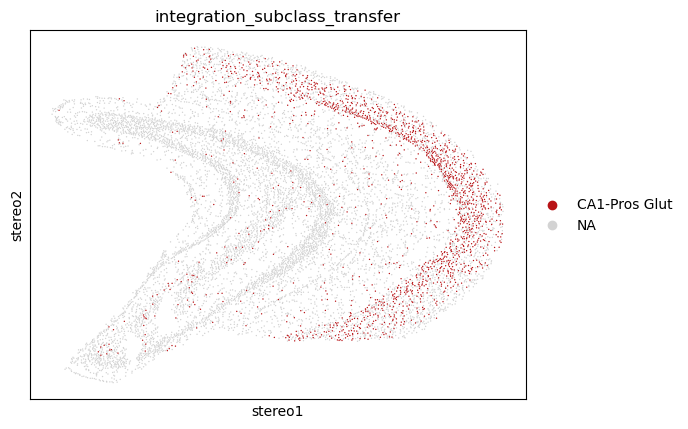

View of AnnData object with n_obs × n_vars = 1706 × 27296
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Sample', 'Class', 'Subclass', 'Subtype', 'Ann_subclass_cell', 'Type', 'New_Type', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-HIP_1-seq', 'highly_variable-HIP_1-seq', 'means-HIP_1-seq', 'dispersions-HIP_1-seq', 'dispersions_norm-HIP_1-seq', 'n_cells-HIP_2-seq', 'highly_variable-HIP_2-seq', 'means-HIP_2-seq', 'dispersions-HIP_2-seq', 'dispersions_norm-HIP_2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'integration_subclass_transfer_colors'
    obsm: 'X_pca', 'X_umap', 'stereo', 'X_pca_integrate'
    varm: 'PCs'
    la

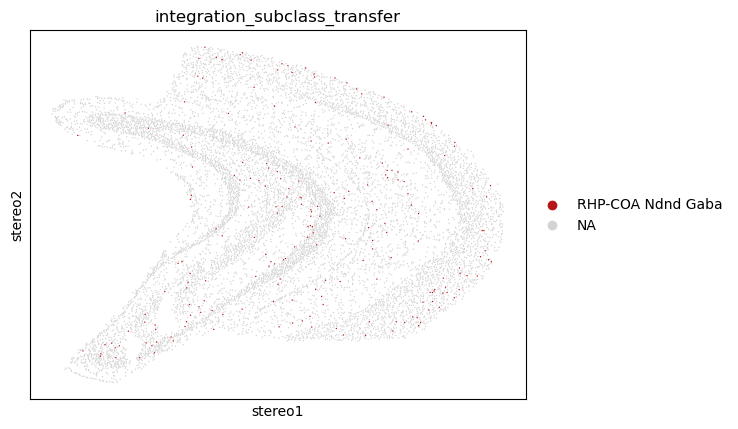

View of AnnData object with n_obs × n_vars = 209 × 27296
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Sample', 'Class', 'Subclass', 'Subtype', 'Ann_subclass_cell', 'Type', 'New_Type', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-HIP_1-seq', 'highly_variable-HIP_1-seq', 'means-HIP_1-seq', 'dispersions-HIP_1-seq', 'dispersions_norm-HIP_1-seq', 'n_cells-HIP_2-seq', 'highly_variable-HIP_2-seq', 'means-HIP_2-seq', 'dispersions-HIP_2-seq', 'dispersions_norm-HIP_2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'integration_subclass_transfer_colors'
    obsm: 'X_pca', 'X_umap', 'stereo', 'X_pca_integrate'
    varm: 'PCs'
    lay

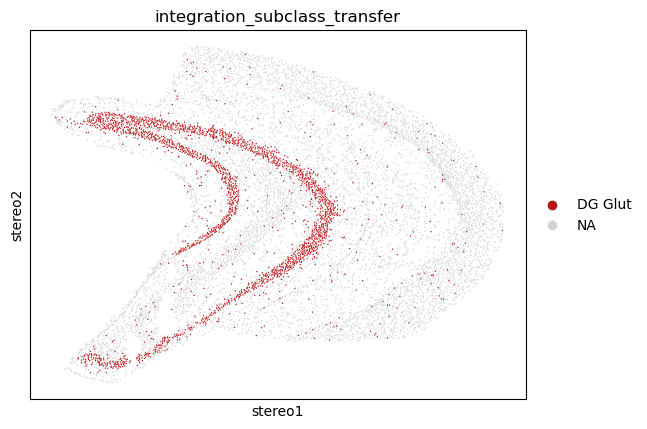

View of AnnData object with n_obs × n_vars = 2421 × 27296
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Sample', 'Class', 'Subclass', 'Subtype', 'Ann_subclass_cell', 'Type', 'New_Type', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-HIP_1-seq', 'highly_variable-HIP_1-seq', 'means-HIP_1-seq', 'dispersions-HIP_1-seq', 'dispersions_norm-HIP_1-seq', 'n_cells-HIP_2-seq', 'highly_variable-HIP_2-seq', 'means-HIP_2-seq', 'dispersions-HIP_2-seq', 'dispersions_norm-HIP_2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'integration_subclass_transfer_colors'
    obsm: 'X_pca', 'X_umap', 'stereo', 'X_pca_integrate'
    varm: 'PCs'
    la

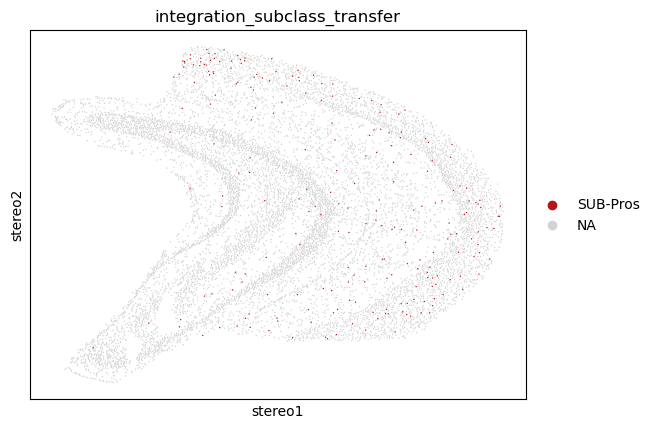

View of AnnData object with n_obs × n_vars = 230 × 27296
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Sample', 'Class', 'Subclass', 'Subtype', 'Ann_subclass_cell', 'Type', 'New_Type', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-HIP_1-seq', 'highly_variable-HIP_1-seq', 'means-HIP_1-seq', 'dispersions-HIP_1-seq', 'dispersions_norm-HIP_1-seq', 'n_cells-HIP_2-seq', 'highly_variable-HIP_2-seq', 'means-HIP_2-seq', 'dispersions-HIP_2-seq', 'dispersions_norm-HIP_2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'integration_subclass_transfer_colors'
    obsm: 'X_pca', 'X_umap', 'stereo', 'X_pca_integrate'
    varm: 'PCs'
    lay

In [26]:
NR_HIP_spatial = NR_HIP_merge[NR_HIP_merge.obs['modality']=='spatial']

sc.pl.embedding(NR_HIP_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['DG-PIR Ex IMN'],palette=["#b81316"])
print(NR_HIP_spatial[NR_HIP_spatial.obs['integration_subclass_transfer']=='DG-PIR Ex IMN'])
sc.pl.embedding(NR_HIP_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Microglia'],palette=["#b81316"])
print(NR_HIP_spatial[NR_HIP_spatial.obs['integration_subclass_transfer']=='Microglia'])
sc.pl.embedding(NR_HIP_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Lamp5 Lhx6 Gaba'],palette=["#b81316"])
print(NR_HIP_spatial[NR_HIP_spatial.obs['integration_subclass_transfer']=='Lamp5 Lhx6 Gaba'])
sc.pl.embedding(NR_HIP_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Oligo'],palette=["#b81316"])
print(NR_HIP_spatial[NR_HIP_spatial.obs['integration_subclass_transfer']=='Oligo'])
sc.pl.embedding(NR_HIP_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Astro'],palette=["#b81316"])
print(NR_HIP_spatial[NR_HIP_spatial.obs['integration_subclass_transfer']=='Astro'])
sc.pl.embedding(NR_HIP_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['CA3 Glut'],palette=["#b81316"])
print(NR_HIP_spatial[NR_HIP_spatial.obs['integration_subclass_transfer']=='CA3 Glut'])
sc.pl.embedding(NR_HIP_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Pvalb chandelier'],palette=["#b81316"])
print(NR_HIP_spatial[NR_HIP_spatial.obs['integration_subclass_transfer']=='Pvalb chandelier'])
sc.pl.embedding(NR_HIP_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Sst Gaba'],palette=["#b81316"])
print(NR_HIP_spatial[NR_HIP_spatial.obs['integration_subclass_transfer']=='Sst Gaba'])
sc.pl.embedding(NR_HIP_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['NP SUB Glut'],palette=["#b81316"])
print(NR_HIP_spatial[NR_HIP_spatial.obs['integration_subclass_transfer']=='NP SUB Glut'])
sc.pl.embedding(NR_HIP_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['OPC'],palette=["#b81316"])
print(NR_HIP_spatial[NR_HIP_spatial.obs['integration_subclass_transfer']=='OPC'])
sc.pl.embedding(NR_HIP_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Pvalb'],palette=["#b81316"])
print(NR_HIP_spatial[NR_HIP_spatial.obs['integration_subclass_transfer']=='Pvalb'])
sc.pl.embedding(NR_HIP_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['CA1-Pros Glut'],palette=["#b81316"])
print(NR_HIP_spatial[NR_HIP_spatial.obs['integration_subclass_transfer']=='CA1-Pros Glut'])
sc.pl.embedding(NR_HIP_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['RHP-COA Ndnd Gaba'],palette=["#b81316"])
print(NR_HIP_spatial[NR_HIP_spatial.obs['integration_subclass_transfer']=='RHP-COA Ndnd Gaba'])
sc.pl.embedding(NR_HIP_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['DG Glut'],palette=["#b81316"])
print(NR_HIP_spatial[NR_HIP_spatial.obs['integration_subclass_transfer']=='DG Glut'])
sc.pl.embedding(NR_HIP_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['SUB-Pros'],palette=["#b81316"])
print(NR_HIP_spatial[NR_HIP_spatial.obs['integration_subclass_transfer']=='SUB-Pros'])

In [27]:
coembedding_umap_df = NR_HIP_merge.obs[[]].copy()
coembedding_umap_df['umap_x'] = NR_HIP_merge.obsm['X_umap'][:, 0]
coembedding_umap_df['umap_y'] = NR_HIP_merge.obsm['X_umap'][:, 1]
coembedding_umap_df.to_csv('coembedding_umap.csv')

In [ ]:
#Integrate individual partitions

In [28]:
def impute_gene_expression(integrator, adata_list, X_ref, ref=0, qry=1, npc=30, k_weight=30, sd=1,
                           chunk_size=1000, random_state=0):
    data_qry = adata_list[qry].obsm['X_pca']

    anchor, G, D, cum_qry = integrator.find_nearest_anchor(adata_list, data_qry=data_qry, ref=[ref], qry=[qry],
                                                      npc=npc, k_weight=k_weight, sd=sd, random_state=random_state)
    
    if scipy.sparse.issparse(X_ref):
        X_ref = X_ref.toarray()
    
    X_anchor = X_ref[anchor[:, 0]]
    imputed_chunks = []
    
    for chunk_start in np.arange(0, data_qry.shape[0], chunk_size):
        imputed_chunks.append(scipy.sparse.csr_matrix((
                        D[chunk_start:(chunk_start + chunk_size), :, None] *
                        X_anchor[G[chunk_start:(chunk_start + chunk_size)]]
                    ).sum(axis=1).astype(np.float32)))

    return scipy.sparse.vstack(imputed_chunks)

Integrating for partition p24


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 42514 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 2/2 New_Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 1706 × 21122
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'New_Type_transfer', 'New_Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-HIP_1', 'highly_variable-HIP_1', 'means-HIP_1', 'dispersions-HIP_1', 'dispersions_norm-HIP_1', 'n_cells-HIP_2', 'highly_variable-HIP_2', 'means-HIP_2', 'dispersions-HIP_2', 'dispersions_norm-HIP_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


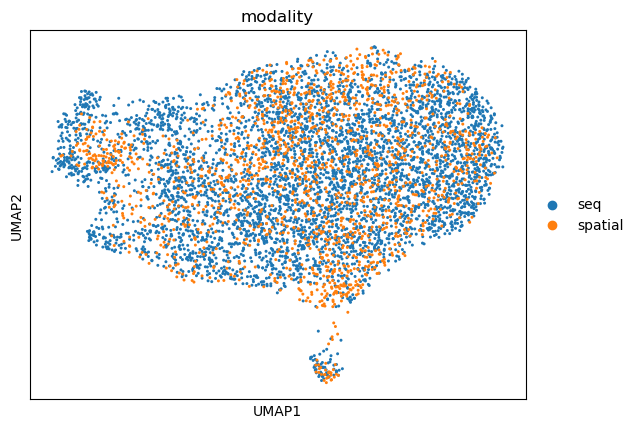

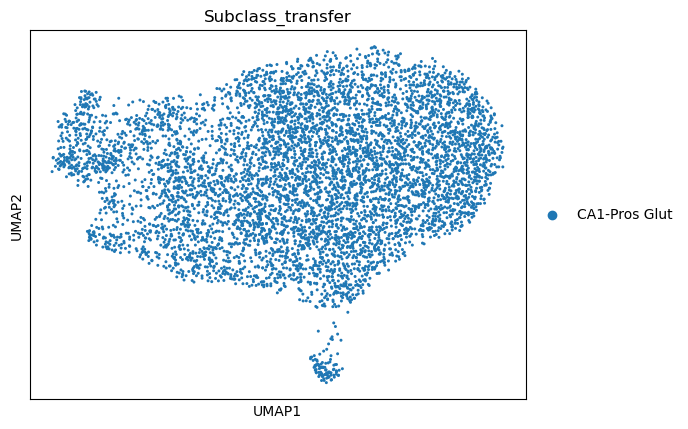

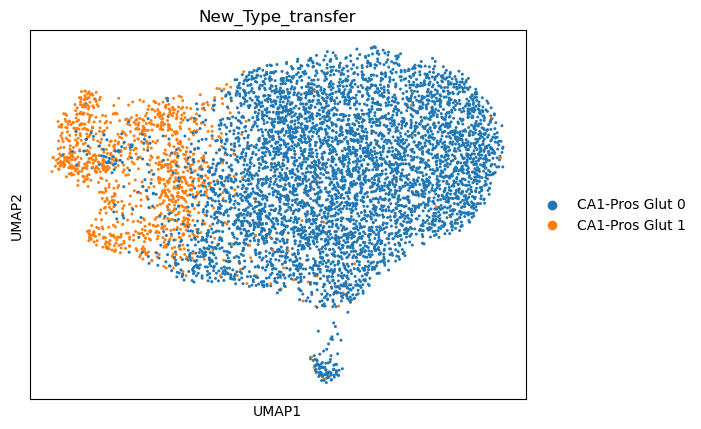

Integrating for partition p49


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 60250 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 3/3 New_Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 2421 × 21122
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'New_Type_transfer', 'New_Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-HIP_1', 'highly_variable-HIP_1', 'means-HIP_1', 'dispersions-HIP_1', 'dispersions_norm-HIP_1', 'n_cells-HIP_2', 'highly_variable-HIP_2', 'means-HIP_2', 'dispersions-HIP_2', 'dispersions_norm-HIP_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


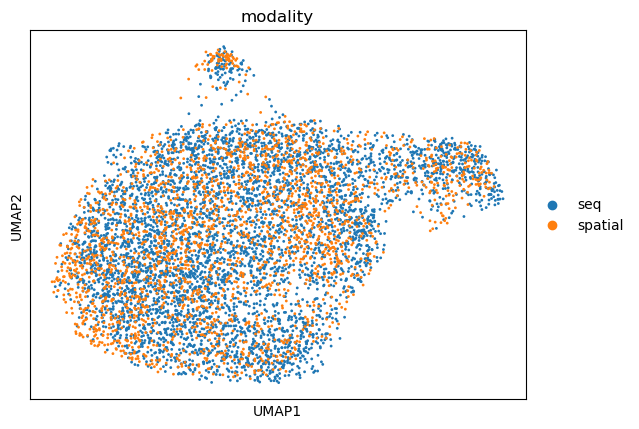

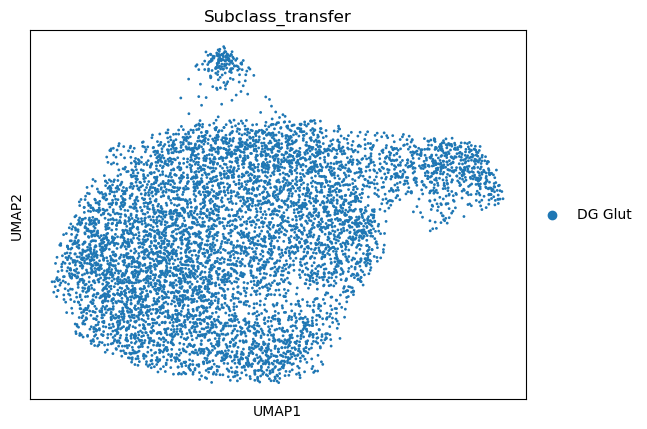

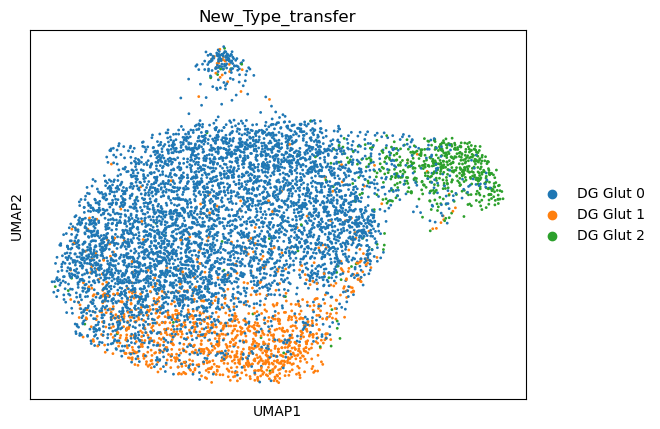

Integrating for partition p52


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 10390 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 New_Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 457 × 21122
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'New_Type_transfer', 'New_Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-HIP_1', 'highly_variable-HIP_1', 'means-HIP_1', 'dispersions-HIP_1', 'dispersions_norm-HIP_1', 'n_cells-HIP_2', 'highly_variable-HIP_2', 'means-HIP_2', 'dispersions-HIP_2', 'dispersions_norm-HIP_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


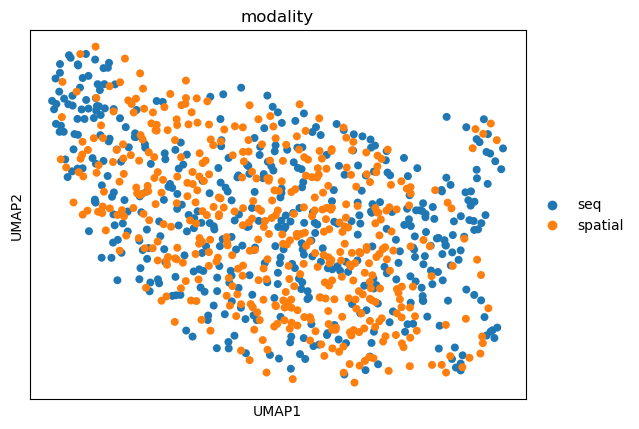

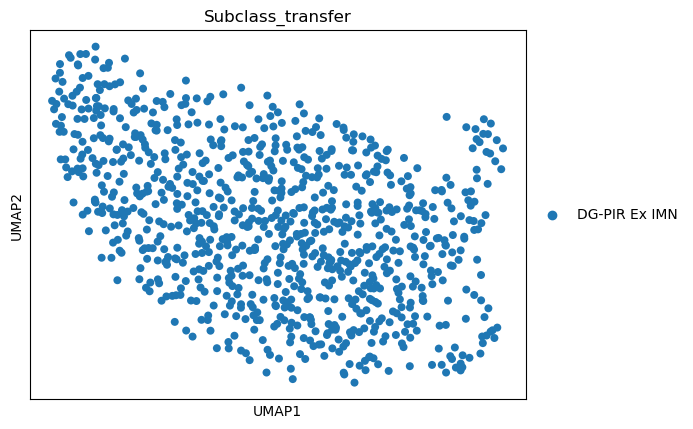

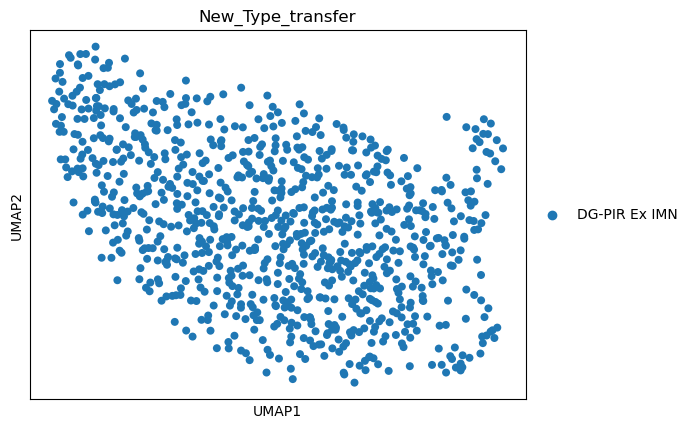

Integrating for partition p55


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 8210 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 New_Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 329 × 21122
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'New_Type_transfer', 'New_Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-HIP_1', 'highly_variable-HIP_1', 'means-HIP_1', 'dispersions-HIP_1', 'dispersions_norm-HIP_1', 'n_cells-HIP_2', 'highly_variable-HIP_2', 'means-HIP_2', 'dispersions-HIP_2', 'dispersions_norm-HIP_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


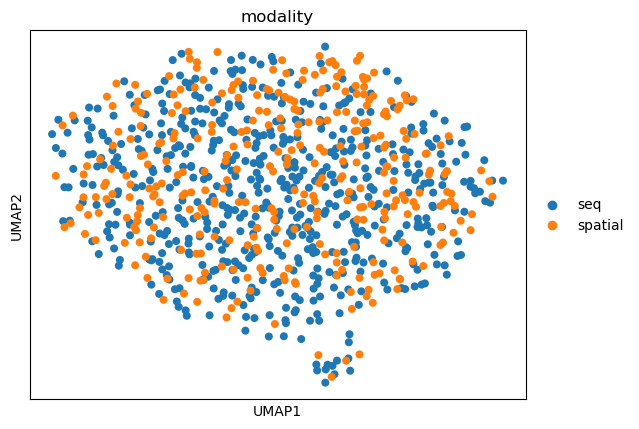

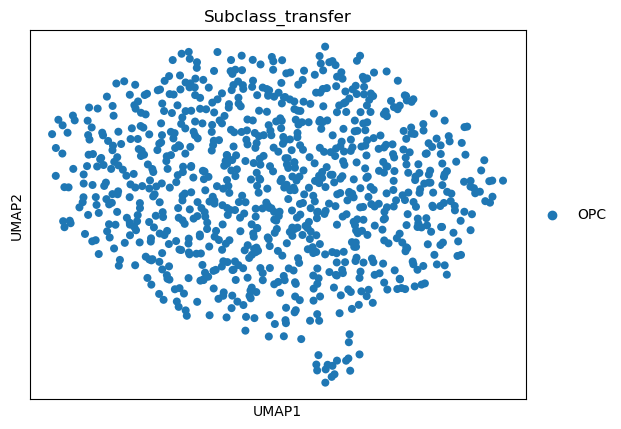

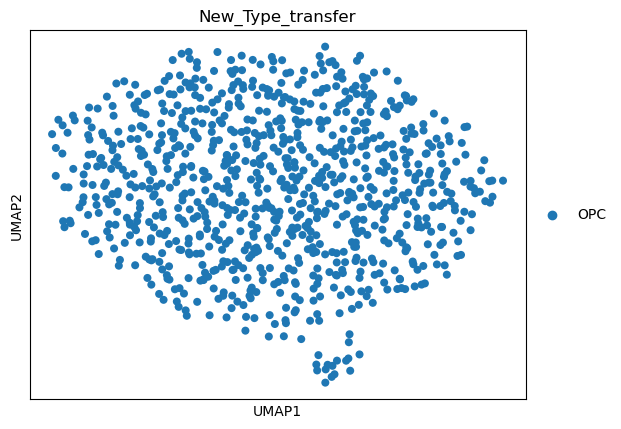

Integrating for partition p58


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 5736 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 New_Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 230 × 21122
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'New_Type_transfer', 'New_Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-HIP_1', 'highly_variable-HIP_1', 'means-HIP_1', 'dispersions-HIP_1', 'dispersions_norm-HIP_1', 'n_cells-HIP_2', 'highly_variable-HIP_2', 'means-HIP_2', 'dispersions-HIP_2', 'dispersions_norm-HIP_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


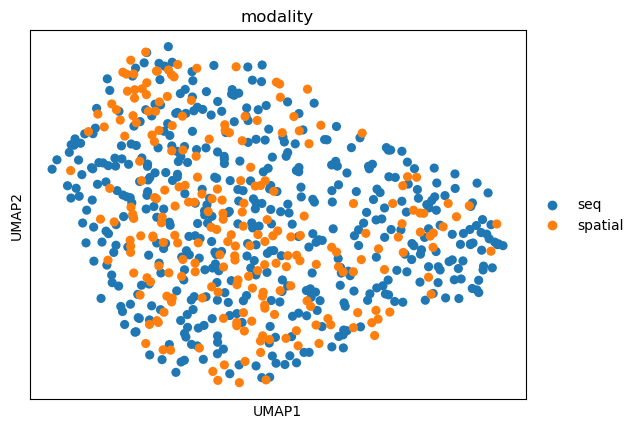

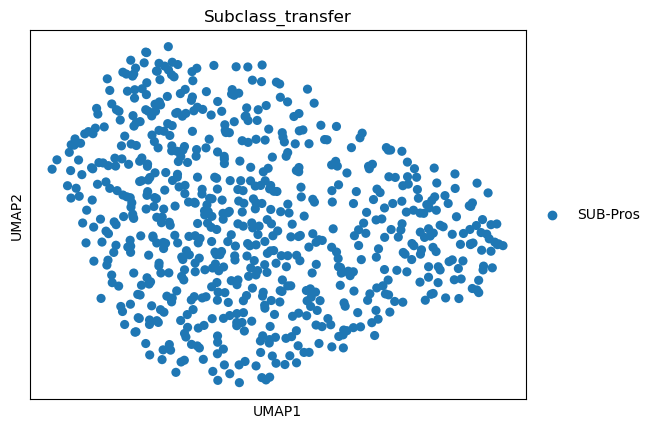

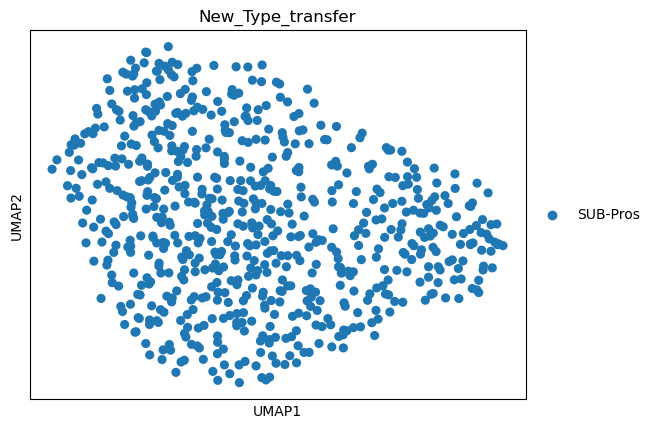

Integrating for partition p60


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 3625 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 New_Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 145 × 21122
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'New_Type_transfer', 'New_Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-HIP_1', 'highly_variable-HIP_1', 'means-HIP_1', 'dispersions-HIP_1', 'dispersions_norm-HIP_1', 'n_cells-HIP_2', 'highly_variable-HIP_2', 'means-HIP_2', 'dispersions-HIP_2', 'dispersions_norm-HIP_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


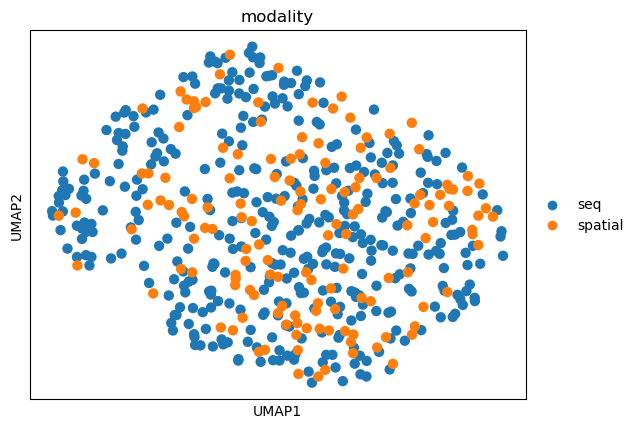

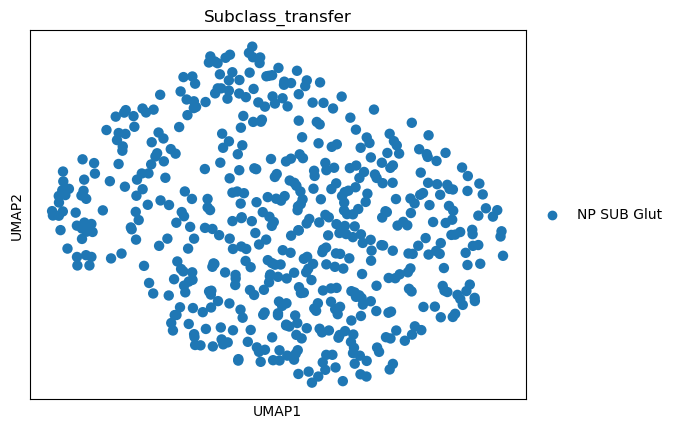

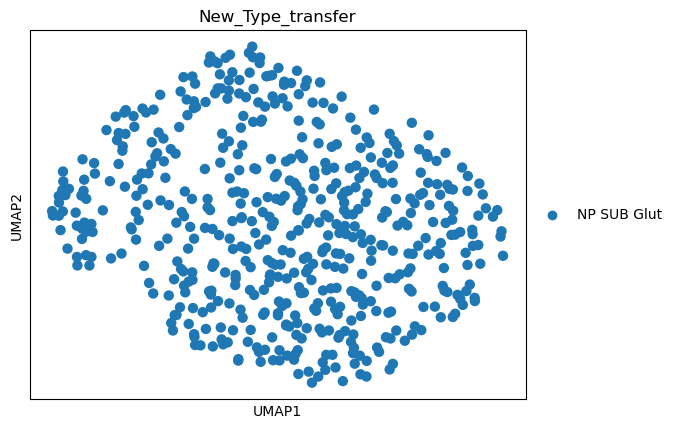

Integrating for partition p61


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 4450 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 New_Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 421 × 21122
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'New_Type_transfer', 'New_Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-HIP_1', 'highly_variable-HIP_1', 'means-HIP_1', 'dispersions-HIP_1', 'dispersions_norm-HIP_1', 'n_cells-HIP_2', 'highly_variable-HIP_2', 'means-HIP_2', 'dispersions-HIP_2', 'dispersions_norm-HIP_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


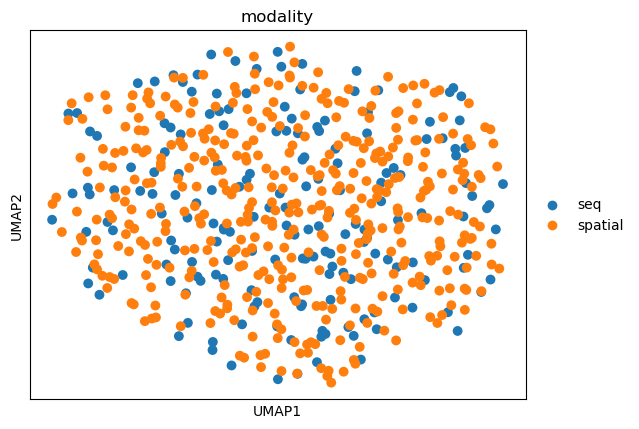

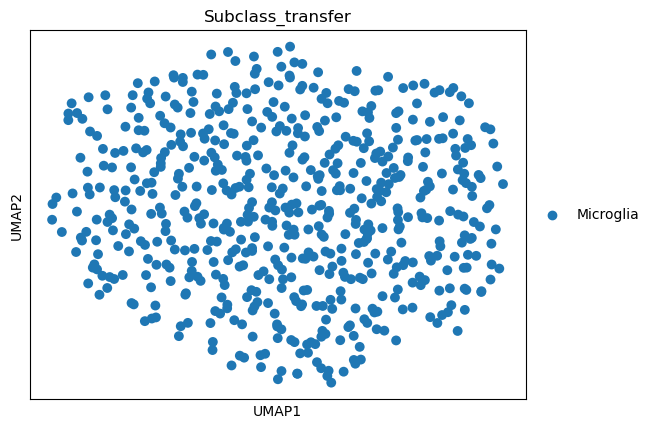

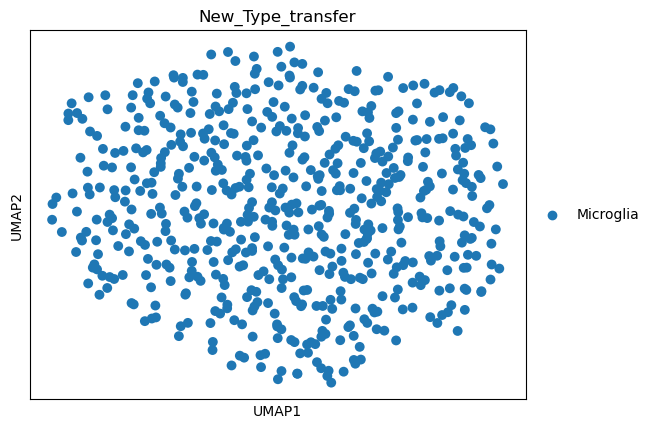

Integrating for partition p64


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 3250 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 New_Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 130 × 21122
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'New_Type_transfer', 'New_Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-HIP_1', 'highly_variable-HIP_1', 'means-HIP_1', 'dispersions-HIP_1', 'dispersions_norm-HIP_1', 'n_cells-HIP_2', 'highly_variable-HIP_2', 'means-HIP_2', 'dispersions-HIP_2', 'dispersions_norm-HIP_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


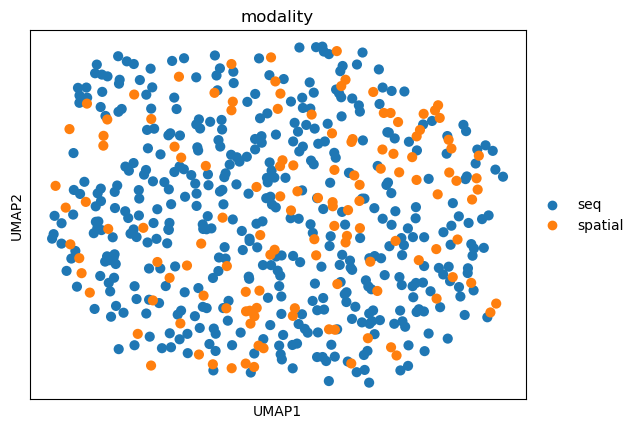

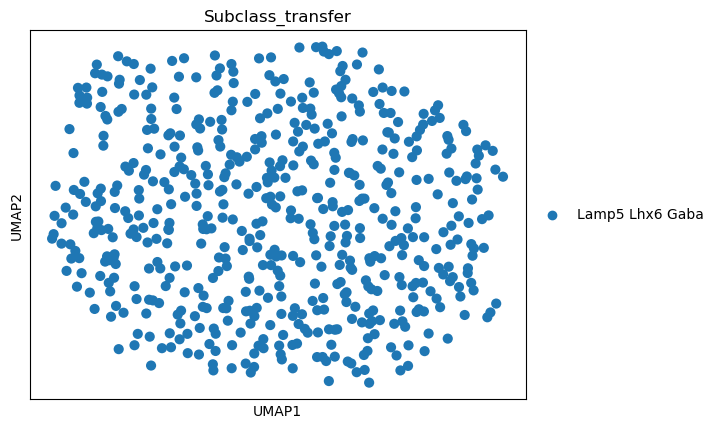

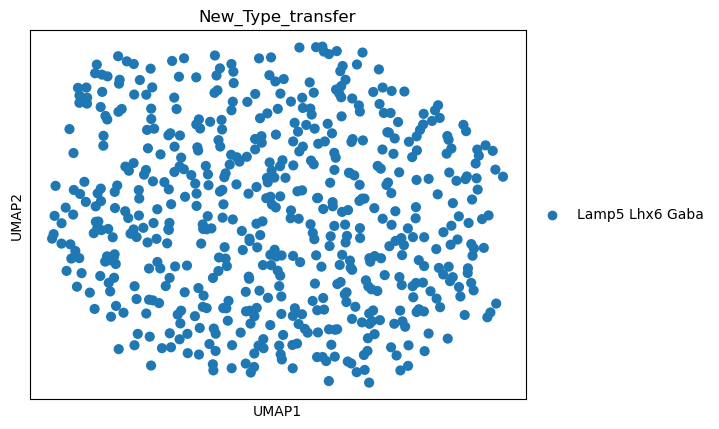

Integrating for partition p67


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 4425 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 New_Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 177 × 21122
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'New_Type_transfer', 'New_Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-HIP_1', 'highly_variable-HIP_1', 'means-HIP_1', 'dispersions-HIP_1', 'dispersions_norm-HIP_1', 'n_cells-HIP_2', 'highly_variable-HIP_2', 'means-HIP_2', 'dispersions-HIP_2', 'dispersions_norm-HIP_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


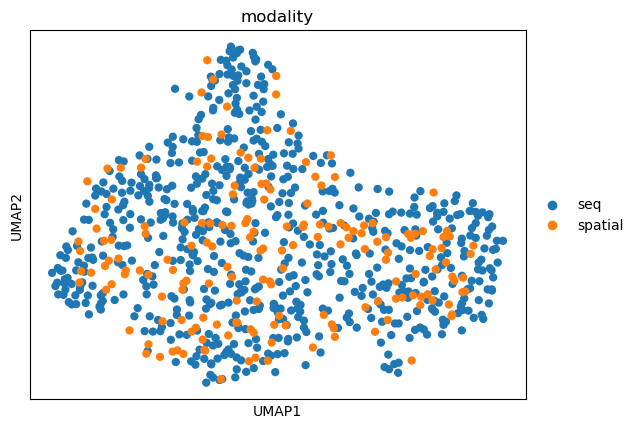

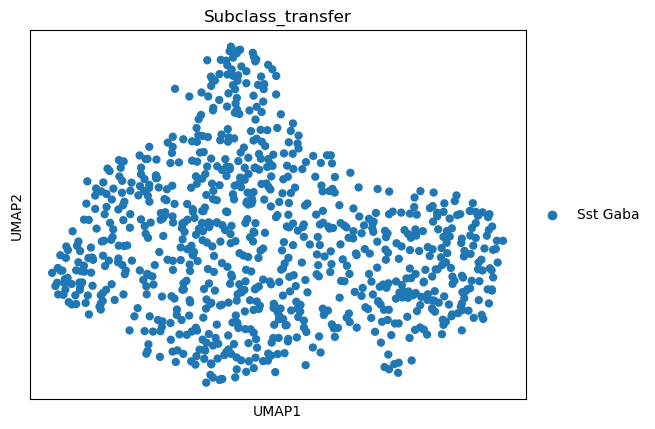

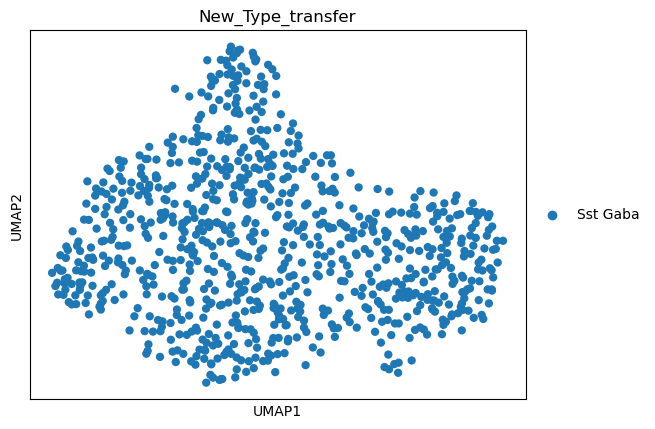

Integrating for partition p70


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 5225 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 New_Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 209 × 21122
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'New_Type_transfer', 'New_Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-HIP_1', 'highly_variable-HIP_1', 'means-HIP_1', 'dispersions-HIP_1', 'dispersions_norm-HIP_1', 'n_cells-HIP_2', 'highly_variable-HIP_2', 'means-HIP_2', 'dispersions-HIP_2', 'dispersions_norm-HIP_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


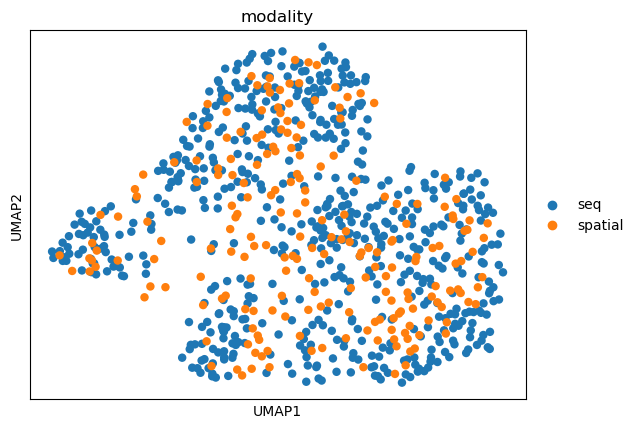

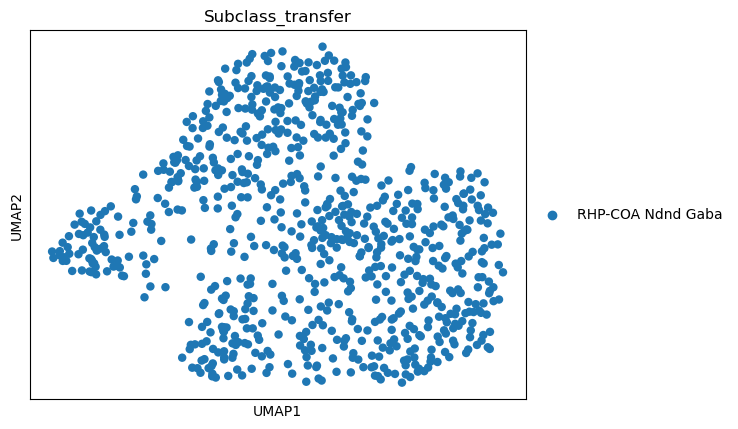

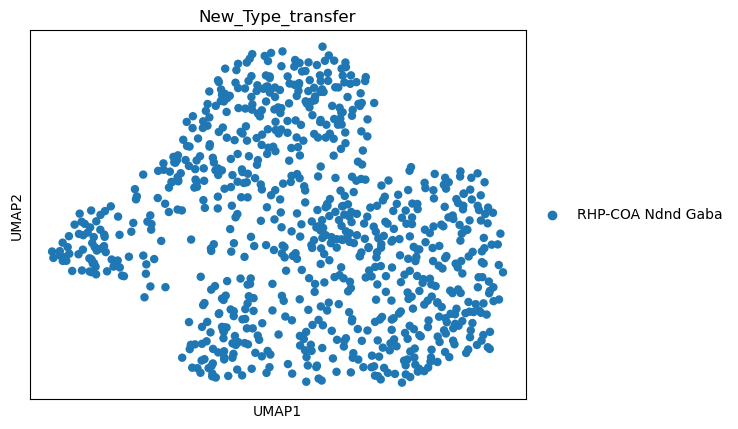

Integrating for partition p71


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=33
Score Anchors
Identified 875 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 New_Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 35 × 21122
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'New_Type_transfer', 'New_Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-HIP_1', 'highly_variable-HIP_1', 'means-HIP_1', 'dispersions-HIP_1', 'dispersions_norm-HIP_1', 'n_cells-HIP_2', 'highly_variable-HIP_2', 'means-HIP_2', 'dispersions-HIP_2', 'dispersions_norm-HIP_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


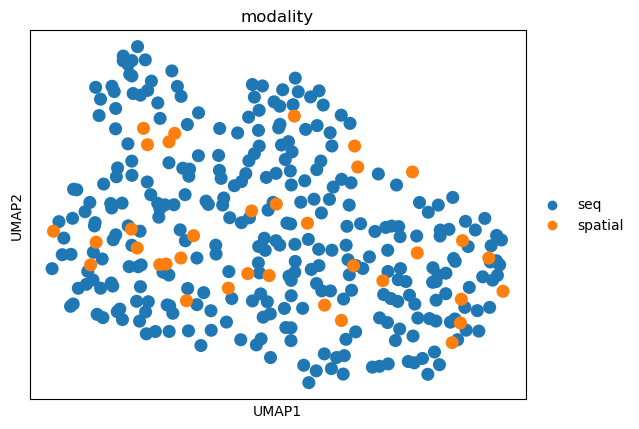

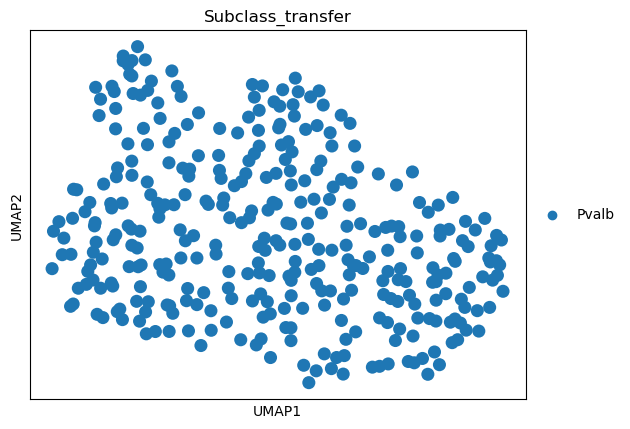

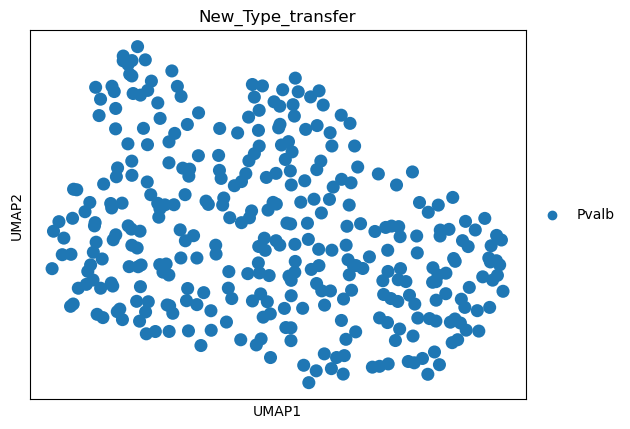

Integrating for partition p72
Missing input files for partition p72. Skipping this integration.
Integrating for partition p74


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 10221 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 New_Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 695 × 21122
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'New_Type_transfer', 'New_Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-HIP_1', 'highly_variable-HIP_1', 'means-HIP_1', 'dispersions-HIP_1', 'dispersions_norm-HIP_1', 'n_cells-HIP_2', 'highly_variable-HIP_2', 'means-HIP_2', 'dispersions-HIP_2', 'dispersions_norm-HIP_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


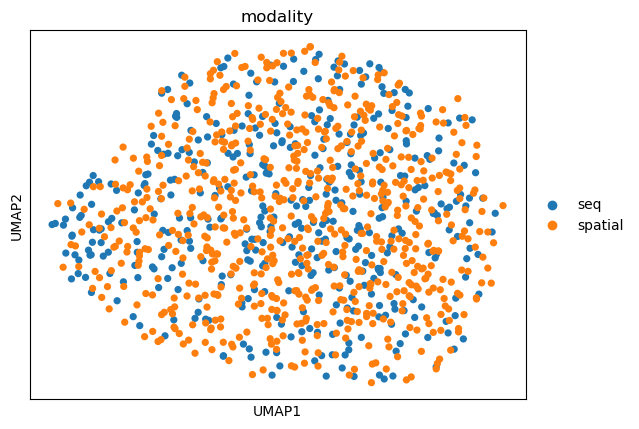

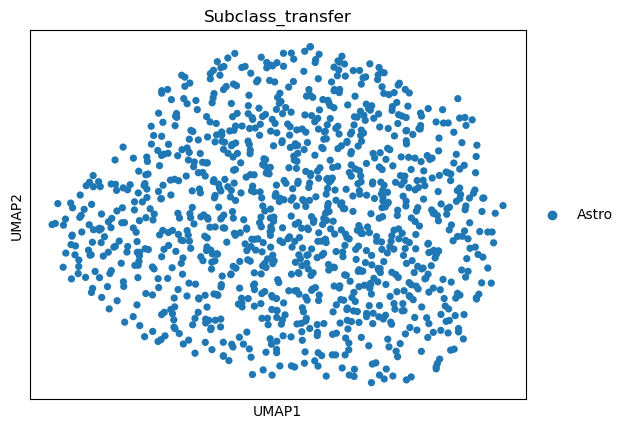

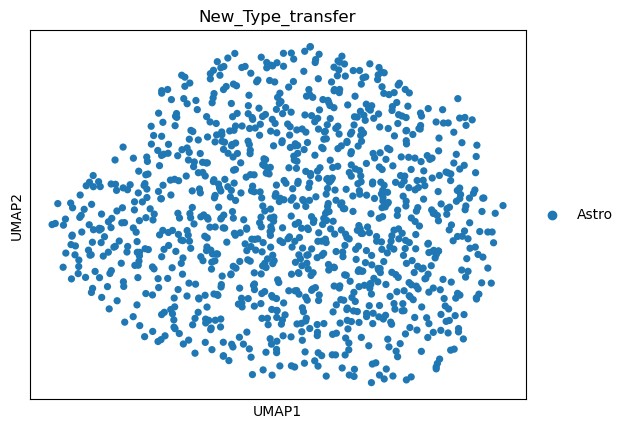

Integrating for partition p86


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 42947 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 3/3 New_Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 1737 × 21122
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'New_Type_transfer', 'New_Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-HIP_1', 'highly_variable-HIP_1', 'means-HIP_1', 'dispersions-HIP_1', 'dispersions_norm-HIP_1', 'n_cells-HIP_2', 'highly_variable-HIP_2', 'means-HIP_2', 'dispersions-HIP_2', 'dispersions_norm-HIP_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


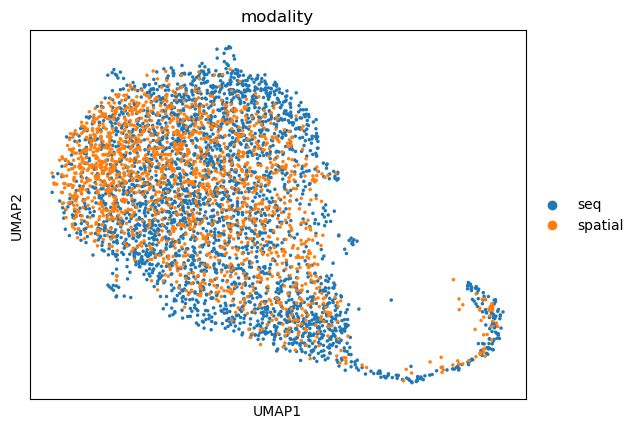

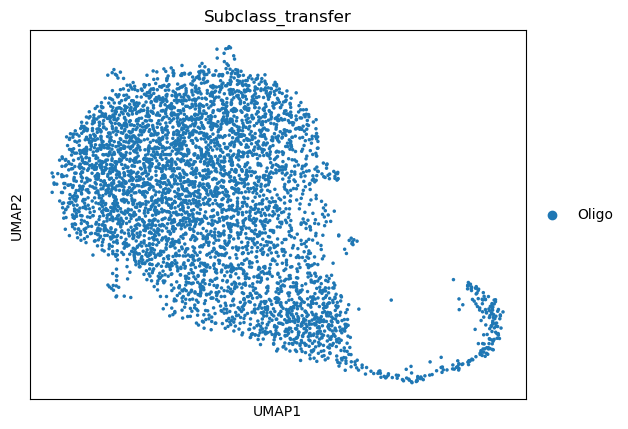

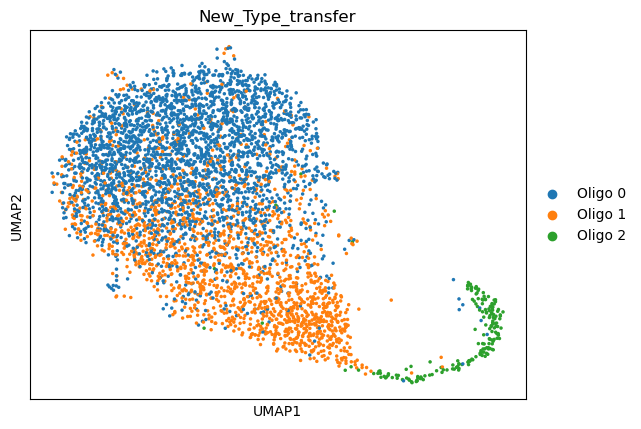

Integrating for partition p99


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 36358 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 6/6 New_Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 1464 × 21122
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'New_Type_transfer', 'New_Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-HIP_1', 'highly_variable-HIP_1', 'means-HIP_1', 'dispersions-HIP_1', 'dispersions_norm-HIP_1', 'n_cells-HIP_2', 'highly_variable-HIP_2', 'means-HIP_2', 'dispersions-HIP_2', 'dispersions_norm-HIP_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


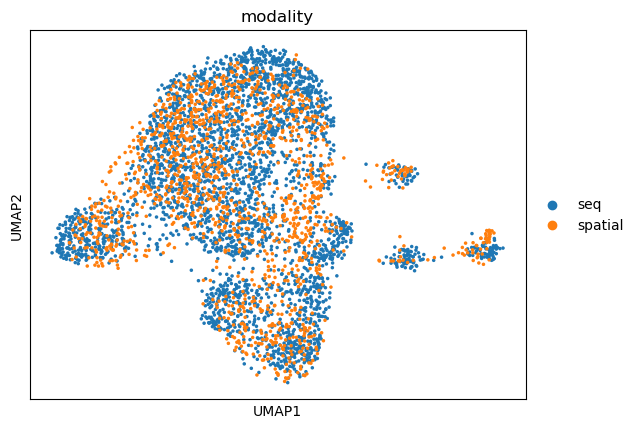

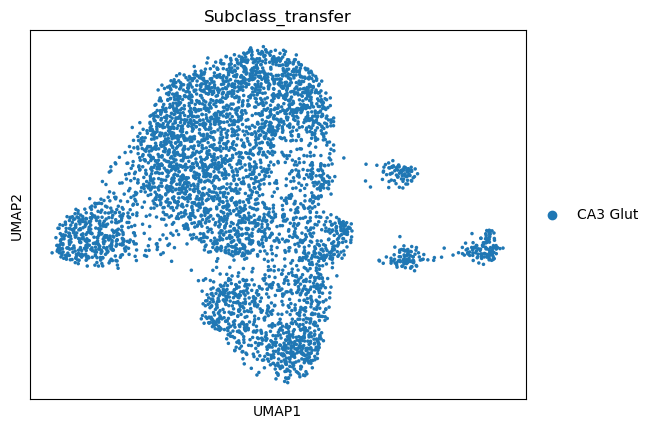

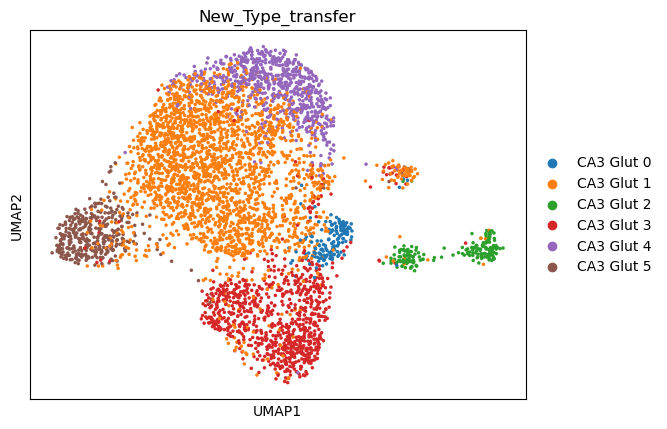

CPU times: user 1h 24min 35s, sys: 7min 46s, total: 1h 32min 21s
Wall time: 38min 7s


In [29]:

%%time
# 设置工作目录
workspace_path = '/mnt/f/spatial/HIP/NR1_2/'
partition_path = workspace_path + 'partitions/'
partitions = sorted(os.listdir(partition_path))

for pn in partitions:
    print(f'Integrating for partition {pn}')
    
    # 设置每个分区的文件路径
    integration_path = partition_path + pn + '/'
    input_adata_seq_file = os.path.join(integration_path, 'adata_seq.h5ad')
    input_adata_spatial_file = os.path.join(integration_path, 'adata_spatial_integrated.h5ad')
    
    # 检查文件是否存在
    if not (os.path.exists(input_adata_seq_file) and os.path.exists(input_adata_spatial_file)):
        print(f'Missing input files for partition {pn}. Skipping this integration.')
        continue  # 如果文件缺失，跳过此分区
    ## Load and preprocess the data
    adata_seq_raw = sc.read_h5ad(input_adata_seq_file)
    adata_seq = adata_seq_raw.copy()
    adata_spatial_raw = sc.read_h5ad(input_adata_spatial_file)
    adata_spatial = adata_spatial_raw.copy()

    # Consider the common genes
    common_genes = np.array(adata_seq.var_names.intersection(adata_spatial.var_names))
    #adata_seq._inplace_subset_var(common_genes)
    
    # Normalize
    sc.pp.normalize_total(adata_seq, target_sum=1000)
    sc.pp.log1p(adata_seq)
    sc.pp.normalize_total(adata_spatial, target_sum=1000)
    sc.pp.log1p(adata_spatial)
    
    # Select variable genes
    #sc.pp.highly_variable_genes(adata_seq)
    #hv_genes = list(adata_seq.var.index[adata_seq.var['dispersions'] > 0])
    #adata_seq = adata_seq[:, adata_seq.var.index.isin(hv_genes)]
    #adata_spatial = adata_spatial[:, adata_spatial.var.index.isin(hv_genes)]
    #print(f'Use {len(hv_genes)} highly variable genes for integration.')
    
    # Scale the data
    sc.pp.scale(adata_seq)
    sc.pp.scale(adata_spatial)
    
    # Merge the datasets
    adata_merge = adata_seq.concatenate(adata_spatial,
                                    batch_categories=['seq', 'spatial'],
                                    batch_key='modality',
                                    index_unique=None)
     # Select variable genes
    #sc.pp.highly_variable_genes(adata_merge)
    #target_genes=['Syt17','Stard8','Whrn','Rorb','Scnn1a','Syt2','Tle4','Syt6','Ccn2']
    #adata_merge.var['highly_variable'] = (
    #adata_merge.var['highly_variable'] | adata_merge.var_names.isin(target_genes))
    # PCA

    n_pcs = 30
    sc.tl.pca(adata_merge, svd_solver='arpack', n_comps=n_pcs)
    
    adata_list = [adata_merge[adata_merge.obs['modality'] == 'seq'],
                  adata_merge[adata_merge.obs['modality'] == 'spatial']]
    
    ## Integration
    # Find the integration anchors
    integrator = SeuratIntegration()
    integrator.find_anchor(adata_list,
                       k_local=None,
                       key_local='X_pca',
                       k_anchor=25,
                       key_anchor='X',
                       dim_red='cca',
                       max_cc_cells=100000,
                       k_score=100,
                       k_filter=None, #why?
                       scale1=False,
                       scale2=False,
                       n_components=n_pcs,
                       n_features=200,
                       alignments=[[[0], [1]]])
    
    # Label transfer
    cell_type_cols = ['Subclass', 'New_Type']
    transfer_results = integrator.label_transfer(
        ref=[0],
        qry=[1],
        categorical_key=cell_type_cols,
        key_dist='X_pca',
        k_weight=100,
        npc=n_pcs
    )
    integrator.save_transfer_results_to_adata(adata_merge, transfer_results)
    
    # Assign the transfered labels and the confidence
    for cell_type_col in cell_type_cols:
        adata_spatial_raw.obs[cell_type_col + '_transfer'] = transfer_results[cell_type_col].idxmax(axis=1
                                                                                           ).astype('category')
        adata_spatial_raw.obs[cell_type_col + '_confidence'] = transfer_results[cell_type_col].max(axis=1)
        
        n_transfered = len(np.unique(adata_spatial_raw.obs[cell_type_col + '_transfer']))
        n_total = len(np.unique(adata_merge.obs[cell_type_col + '_transfer']))
        print(f'Transfered {n_transfered}/{n_total} {cell_type_col}.')
    
    # Impute gene expression
    X_imputed = impute_gene_expression(integrator, adata_list, adata_seq_raw.X, 
                                       ref=0, qry=1, npc=n_pcs, chunk_size=5000)
    adata_imputed = anndata.AnnData(X=X_imputed, obs=adata_spatial_raw.obs.copy(), 
                                var=adata_seq_raw.var.copy(), dtype=np.float32)
    print(adata_imputed)

    # 创建一个具有与 `adata_spatial_raw` 相同维度的矩阵，初始值为 0
    imputed_data = np.zeros(adata_spatial_raw.shape)

    # 匹配并填充 `imputed_data` 中的基因表达数据
    for i, gene in enumerate(adata_imputed.var_names):
        if gene in adata_spatial_raw.var_names:
           idx = adata_spatial_raw.var_names.get_loc(gene)
           imputed_data[:, idx] = adata_imputed[:, i].X.toarray().flatten()

    # 将填充后的矩阵存储在 `layers` 中
    adata_spatial_raw.layers['imputed'] = imputed_data
    # Save the label transfer results
    adata_spatial_raw.write_h5ad(os.path.join(integration_path, 'adata_spatial_label_transfer.h5ad'), 
                                 compression='gzip')
    # Create the imputation gene partition table
    gene_partition_df = adata_seq_raw.var.copy()
    gene_partition_df.index.name = 'gene'
    gene_partition_df['gene_partition'] = np.arange(gene_partition_df.shape[0], dtype=int) // 1000
    gene_partition_df.to_csv(os.path.join(integration_path,f'/mnt/f/spatial/HIP/NR1_2/partitions/{pn}/gene_partition.csv'))
    
    gene_partitions = np.unique(gene_partition_df['gene_partition'])

    
    ## Co-embedding
    # Correct the PCs using the integration anchors
    corrected = integrator.integrate(key_correct='X_pca',
                                 row_normalize=True,
                                 n_components=n_pcs,
                                 k_weight=100,
                                 sd=1,
                                 alignments=[[[0], [1]]])

    adata_merge.obsm['X_pca_integrate'] = np.concatenate(corrected)
    
    # Calculate KNN using the integrated PCs
    sc.pp.neighbors(adata_merge, use_rep='X_pca_integrate')
    
    if len(np.unique(adata_merge.obs['Subclass_transfer'])) > 1:
        # Generate the PAGA plot for the initial arrangement of the UMAP
        sc.tl.paga(adata_merge, groups='Subclass_transfer')
        sc.pl.paga(adata_merge, save=f'{pn}_paga.png', cmap='gist_ncar')
    
        sc.tl.umap(adata_merge, init_pos='paga', min_dist=0.5)
    else:
        sc.tl.umap(adata_merge, min_dist=0.5)
        
    # Save the umap
    sc.pl.umap(adata_merge, color='modality', save=f'{pn}_umap_modality.png')
    sc.pl.umap(adata_merge, color='Subclass_transfer', save=f'{pn}_umap_subclass.png' )
    sc.pl.umap(adata_merge, color='New_Type_transfer', save=f'{pn}_umap_type.png')

    # 保存合并后的数据
    adata_merge.write_h5ad(os.path.join(integration_path, 'adata_merged_round2.h5ad'), compression='gzip')

In [49]:

%%time
# 设置工作目录
workspace_path = '/mnt/f/spatial/HIP/NR1_2/'
partition_path = workspace_path + 'partitions/'
partitions = ['p186']
for pn in partitions:
    print(f'Integrating for partition {pn}')
    
    # 设置每个分区的文件路径
    integration_path = partition_path + pn + '/'
    input_adata_seq_file = os.path.join(integration_path, 'adata_seq.h5ad')
    input_adata_spatial_file = os.path.join(integration_path, 'adata_spatial_integrated.h5ad')
    
    # 检查文件是否存在
    if not (os.path.exists(input_adata_seq_file) and os.path.exists(input_adata_spatial_file)):
        print(f'Missing input files for partition {pn}. Skipping this integration.')
        continue  # 如果文件缺失，跳过此分区
    ## Load and preprocess the data
    adata_seq_raw = sc.read_h5ad(input_adata_seq_file)
    adata_seq = adata_seq_raw.copy()
    adata_spatial_raw = sc.read_h5ad(input_adata_spatial_file)
    adata_spatial = adata_spatial_raw.copy()

    # Consider the common genes
    common_genes = np.array(adata_seq.var_names.intersection(adata_spatial.var_names))
    #adata_seq._inplace_subset_var(common_genes)
    
    # Normalize
    sc.pp.normalize_total(adata_seq, target_sum=1000)
    sc.pp.log1p(adata_seq)
    sc.pp.normalize_total(adata_spatial, target_sum=1000)
    sc.pp.log1p(adata_spatial)
    
    # Select variable genes
    #sc.pp.highly_variable_genes(adata_seq)
    #hv_genes = list(adata_seq.var.index[adata_seq.var['dispersions'] > 0])
    #adata_seq = adata_seq[:, adata_seq.var.index.isin(hv_genes)]
    #adata_spatial = adata_spatial[:, adata_spatial.var.index.isin(hv_genes)]
    #print(f'Use {len(hv_genes)} highly variable genes for integration.')
    
    # Scale the data
    sc.pp.scale(adata_seq)
    sc.pp.scale(adata_spatial)
    
    # Merge the datasets
    adata_merge = adata_seq.concatenate(adata_spatial,
                                    batch_categories=['seq', 'spatial'],
                                    batch_key='modality',
                                    index_unique=None)
     # Select variable genes
    #sc.pp.highly_variable_genes(adata_merge)
    #target_genes=['Syt17','Stard8','Whrn','Rorb','Scnn1a','Syt2','Tle4','Syt6','Ccn2']
    #adata_merge.var['highly_variable'] = (
    #adata_merge.var['highly_variable'] | adata_merge.var_names.isin(target_genes))
    # PCA

    n_pcs = 100
    sc.tl.pca(adata_merge, svd_solver='arpack', n_comps=n_pcs)
    
    adata_list = [adata_merge[adata_merge.obs['modality'] == 'seq'],
                  adata_merge[adata_merge.obs['modality'] == 'spatial']]
    
    ## Integration
    # Find the integration anchors
    integrator = SeuratIntegration()
    integrator.find_anchor(adata_list,
                       k_local=None,
                       key_local='X_pca',
                       k_anchor=50,
                       key_anchor='X',
                       dim_red='cca',
                       max_cc_cells=100000,
                       k_score=100,
                       k_filter=None, #why?
                       scale1=False,
                       scale2=False,
                       n_components=n_pcs,
                       n_features=200,
                       alignments=[[[0], [1]]])
    
    # Label transfer
    cell_type_cols = ['Subclass', 'Type']
    transfer_results = integrator.label_transfer(
        ref=[0],
        qry=[1],
        categorical_key=cell_type_cols,
        key_dist='X_pca',
        k_weight=100,
        npc=n_pcs
    )
    integrator.save_transfer_results_to_adata(adata_merge, transfer_results)
    
    # Assign the transfered labels and the confidence
    for cell_type_col in cell_type_cols:
        adata_spatial_raw.obs[cell_type_col + '_transfer'] = transfer_results[cell_type_col].idxmax(axis=1
                                                                                           ).astype('category')
        adata_spatial_raw.obs[cell_type_col + '_confidence'] = transfer_results[cell_type_col].max(axis=1)
        
        n_transfered = len(np.unique(adata_spatial_raw.obs[cell_type_col + '_transfer']))
        n_total = len(np.unique(adata_merge.obs[cell_type_col + '_transfer']))
        print(f'Transfered {n_transfered}/{n_total} {cell_type_col}.')
    
    # Impute gene expression
    X_imputed = impute_gene_expression(integrator, adata_list, adata_seq_raw.X, 
                                       ref=0, qry=1, npc=n_pcs, chunk_size=5000)
    adata_imputed = anndata.AnnData(X=X_imputed, obs=adata_spatial_raw.obs.copy(), 
                                var=adata_seq_raw.var.copy(), dtype=np.float32)
    print(adata_imputed)

    # 创建一个具有与 `adata_spatial_raw` 相同维度的矩阵，初始值为 0
    imputed_data = np.zeros(adata_spatial_raw.shape)

    # 匹配并填充 `imputed_data` 中的基因表达数据
    for i, gene in enumerate(adata_imputed.var_names):
        if gene in adata_spatial_raw.var_names:
           idx = adata_spatial_raw.var_names.get_loc(gene)
           imputed_data[:, idx] = adata_imputed[:, i].X.toarray().flatten()

    # 将填充后的矩阵存储在 `layers` 中
    adata_spatial_raw.layers['imputed'] = imputed_data
    # Save the label transfer results
    adata_spatial_raw.write_h5ad(os.path.join(integration_path, 'adata_spatial_label_transfer.h5ad'), 
                                 compression='gzip')
    # Create the imputation gene partition table
    gene_partition_df = adata_seq_raw.var.copy()
    gene_partition_df.index.name = 'gene'
    gene_partition_df['gene_partition'] = np.arange(gene_partition_df.shape[0], dtype=int) // 1000
    gene_partition_df.to_csv(os.path.join(integration_path,f'/mnt/f/spatial/HIP/NR1_2/partitions/{pn}/gene_partition.csv'))
    
    gene_partitions = np.unique(gene_partition_df['gene_partition'])

    
    ## Co-embedding
    # Correct the PCs using the integration anchors
    corrected = integrator.integrate(key_correct='X_pca',
                                 row_normalize=True,
                                 n_components=n_pcs,
                                 k_weight=100,
                                 sd=1,
                                 alignments=[[[0], [1]]])

    adata_merge.obsm['X_pca_integrate'] = np.concatenate(corrected)
    
    # Calculate KNN using the integrated PCs
    sc.pp.neighbors(adata_merge, use_rep='X_pca_integrate')
    
    if len(np.unique(adata_merge.obs['Subclass_transfer'])) > 1:
        # Generate the PAGA plot for the initial arrangement of the UMAP
        sc.tl.paga(adata_merge, groups='Subclass_transfer')
        sc.pl.paga(adata_merge, save=f'{pn}_paga.png', cmap='gist_ncar')
    
        sc.tl.umap(adata_merge, init_pos='paga', min_dist=0.5)
    else:
        sc.tl.umap(adata_merge, min_dist=0.5)
        
    # Save the umap
    sc.pl.umap(adata_merge, color='modality', save=f'{pn}_umap_modality.png')
    sc.pl.embedding(adata_spatial_raw, basis='stereo',color='Subclass_transfer', save=f'{pn}_umap_subclass.png' )
    sc.pl.embedding(adata_spatial_raw, basis='stereo',color='Type_transfer', save=f'{pn}_umap_type.png')

    # 保存合并后的数据
    adata_merge.write_h5ad(os.path.join(integration_path, 'adata_merged_round2.h5ad'), compression='gzip')

Integrating for partition p186


<timed exec>:45: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 100
Find Anchors using k=100
Score Anchors
Identified 8000 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 2/3 Type.
Initialize
Find nearest anchors. k_weight:  30


/root/anaconda3/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
  D = (1 - D / D[:, -1][:, None]) * score[G]
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 160 × 21560
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V2L_1', 'highly_variable-V2L_1', 'means-V2L_1', 'dispersions-V2L_1', 'dispersions_norm-V2L_1', 'n_cells-V2L_2', 'highly_variable-V2L_2', 'means-V2L_2', 'dispersions-V2L_2', 'dispersions_norm-V2L_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'


KeyboardInterrupt: 

In [30]:
import scipy.sparse
import scipy.spatial

def get_cluster_mean_expression_matrix(adata, cluster_column):
    '''Get a dataframe of mean gene expression of each cluster.'''
    if scipy.sparse.issparse(adata.X):
        X = adata.X.toarray()
    else:
        X = adata.X
   
    cell_exp_mtx = pd.DataFrame(X, index=adata.obs[cluster_column], columns=adata.var.index)    
    return cell_exp_mtx.groupby(by=cluster_column).mean()


def calc_cell_cosines_to_cluster_mean_exps(adata, cluster_col, cluster_mean_exp_df):
    cluster_mean_exp_df = cluster_mean_exp_df.loc[:, adata.var.index]
    cluster_id_map = {cluster_mean_exp_df.index[i]:i for i in range(cluster_mean_exp_df.shape[0])}
    cell_cluster_ids = np.array(adata.obs[cluster_col].map(cluster_id_map))
    
    X_cluster_mean = cluster_mean_exp_df.values[cell_cluster_ids]
    
    if scipy.sparse.issparse(adata.X):
        X = adata.X.toarray()
    else:
        X = adata.X
    
    cosines = []
    for i in range(adata.shape[0]):
        if np.sum(X[i]) > 0:
            cosines.append(1 - scipy.spatial.distance.cosine(X[i], X_cluster_mean[i]))
        else:
            cosines.append(0)
    
    return cosines

In [32]:
# Combine the label transfer results

partition_path = '/mnt/f/spatial/HIP/NR1_2/partitions'
partitions = sorted(os.listdir(partition_path))
adatas = []
for pn in partitions:
    adata_file = os.path.join(partition_path, pn, 'adata_spatial_label_transfer.h5ad')
    adatas.append(sc.read_h5ad(adata_file))
    
adata = anndata.concat(adatas)
adata.write_h5ad('/mnt/f/spatial/HIP/NR1_2/spatial_transfer_10.h5ad')

In [33]:
# Combine the merged data
partition_path = '/mnt/f/spatial/HIP/NR1_2/partitions'
partitions = sorted(os.listdir(partition_path))
adatas = []
for pn in partitions:
    adata_file = os.path.join(partition_path, pn, 'adata_merged_round2.h5ad')
    adatas.append(sc.read_h5ad(adata_file))
    
adata_merged2 = anndata.concat(adatas)
adata_merged2.write_h5ad('/mnt/f/spatial/HIP/NR1_2/spatial_merged_round2_10.h5ad')

In [4]:
import scanpy as sc
from scipy.stats import zscore
import matplotlib.pyplot as plt

In [18]:
adata=sc.read_h5ad('F:/spatial/HIP/NR1_2/spatial_transfer_10.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 10156 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    obsm: 'stereo'
    layers: 'imputed'

In [34]:
all_spatial = pd.read_csv('/mnt/f/spatial/HIP/NR1_2_HIP_digitization.csv',index_col='cell_id')

In [35]:
adata_density = adata.obs

In [36]:
all_spatial_index = all_spatial.index.astype(str)

In [37]:
adata_index =adata_density.index.astype(str)

In [38]:
common_index  =all_spatial_index.intersection(adata_index)

In [39]:
common_index =common_index.astype(str)

In [40]:
all_spatial.index = all_spatial.index.astype(str)

In [41]:
spatial_common = all_spatial.loc[all_spatial.index.intersection(common_index)]

In [42]:
adata.obs['digital_layer']=spatial_common['digital_column']

In [43]:
adata.obs['digital_column']=spatial_common['digital_layer']

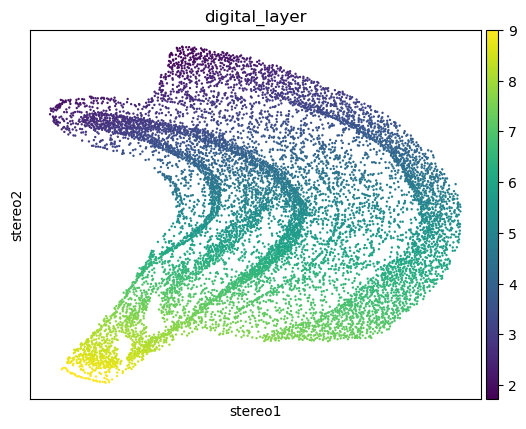

In [44]:
sc.pl.embedding(adata, basis='stereo',color='digital_layer',alpha=None)

In [45]:
adata.write_h5ad('/mnt/f/spatial/HIP/NR1_2/spatial_transfer_digital_layer_10.h5ad')

In [10]:
adata=sc.read_h5ad('F:/spatial/HIP/NR1_2/spatial_transfer_digital_layer_15.h5ad')

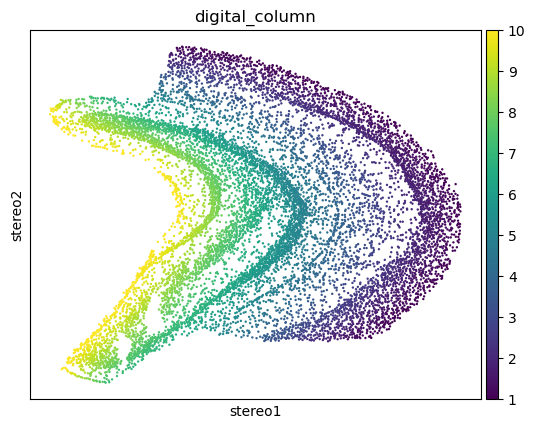

In [48]:
sc.pl.embedding(adata, basis='stereo',color='digital_column',alpha=None)

In [56]:
adata_p = adata[adata.obs['digital_layer'].between(1, 6)]

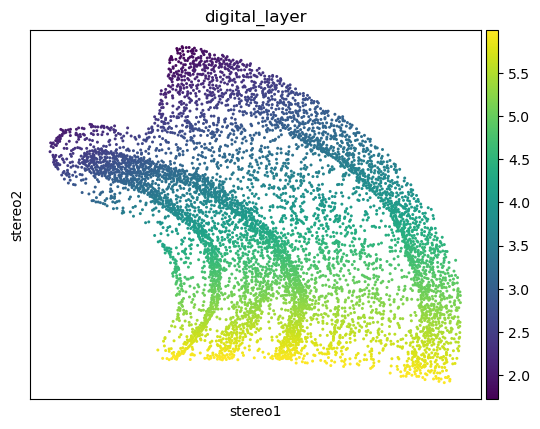

In [72]:
sc.pl.embedding(adata_p, basis='stereo',color='digital_layer',alpha=None)

In [7]:
adata_pp = adata_p[adata_p.obs['digital_column'].between(4, 10)]

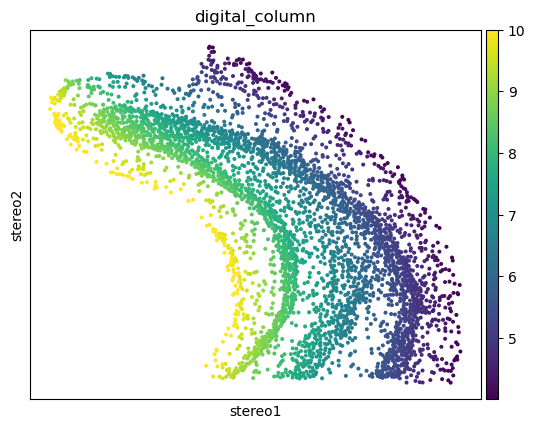

In [102]:
sc.pl.embedding(adata_pp, basis='stereo',color='digital_column',alpha=None)

In [58]:
adata_p.write_h5ad('/mnt/f/spatial/HIP/NR1_2/spatial_transfer_digital_layer6_15.h5ad')

In [6]:
adata_p=sc.read_h5ad('F:/spatial/HIP/NR1_2/spatial_transfer_digital_layer6_15.h5ad')

In [74]:
adata=adata_p

In [ ]:
Partition, N_cells, subclasses
p10, 453, ['DG-PIR Ex IMN']
p11, 178, ['Microglia']
p2, 431, ['Lamp5 Lhx6 Gaba']
p24, 3010, ['Oligo']
p3, 409, ['Astro']
p36, 3211, ['CA3 Glut']
p4, 43, ['Pvalb chandelier']
p42, 665, ['Sst Gaba']
p45, 391, ['NP SUB Glut']
p49, 571, ['OPC']
p5, 304, ['Pvalb']
p74, 4770, ['CA1-Pros Glut']
p8, 604, ['RHP-COA Ndnd Gaba']
p86, 4449, ['DG Glut']
p99, 460, ['SUB-Pros']

In [46]:
adata_it =adata[adata.obs['Subclass_transfer']!='Astro'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='Microglia'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='OPC'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='Oligo'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='Pvalb'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='Sst Gaba'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='RHP-COA Ndnd Gaba'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='Lamp5 Lhx6 Gaba'] 

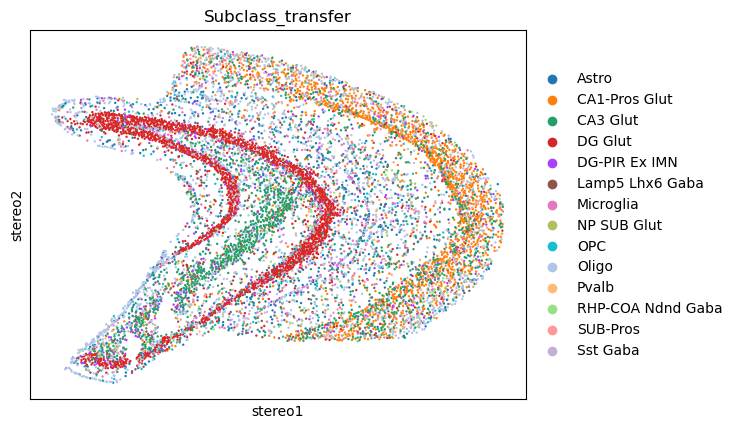

In [47]:
sc.pl.embedding(adata, basis='stereo',color='Subclass_transfer')

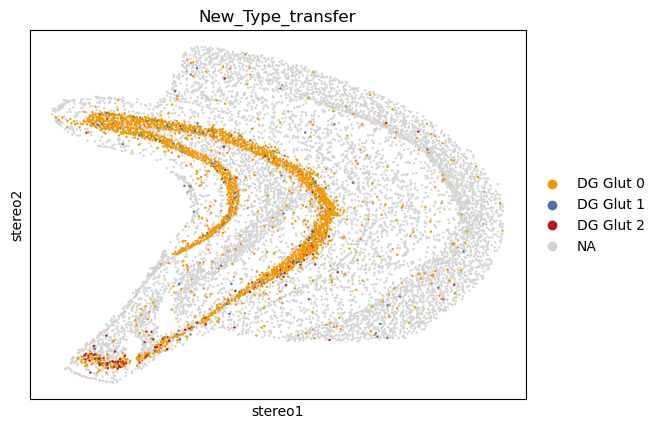

In [48]:
sc.pl.embedding(adata,basis='stereo',color=['New_Type_transfer'],groups=['DG Glut 0','DG Glut 1','DG Glut 2'],palette=["#f29600","#4974a4","#b81316"])

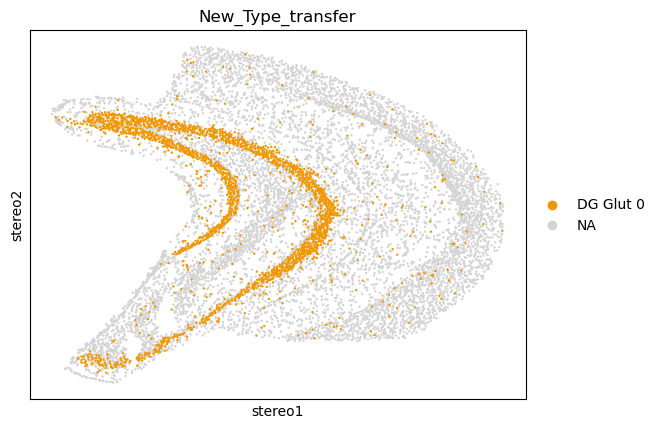

In [49]:
sc.pl.embedding(adata,basis='stereo',color=['New_Type_transfer'],groups=['DG Glut 0'])

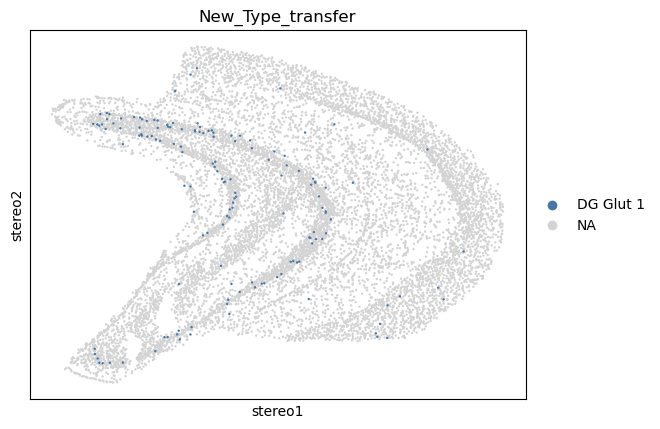

In [50]:
sc.pl.embedding(adata,basis='stereo',color=['New_Type_transfer'],groups=['DG Glut 1'])

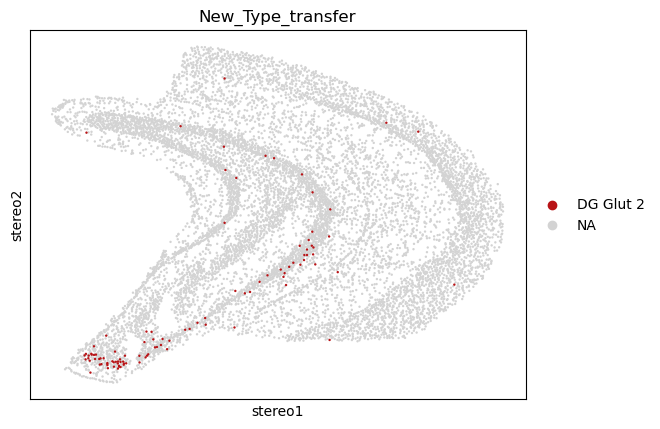

In [51]:
sc.pl.embedding(adata,basis='stereo',color=['New_Type_transfer'],groups=['DG Glut 2'])

In [113]:
adata_oligo=adata[adata.obs['Subclass_transfer']=='Oligo']

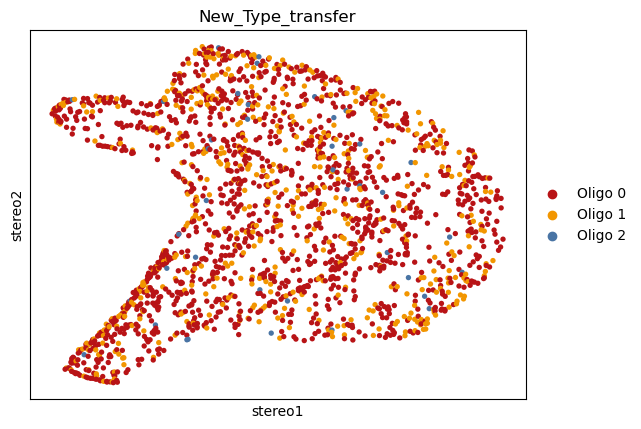

In [115]:
sc.pl.embedding(adata_oligo, basis='stereo',color='New_Type_transfer')

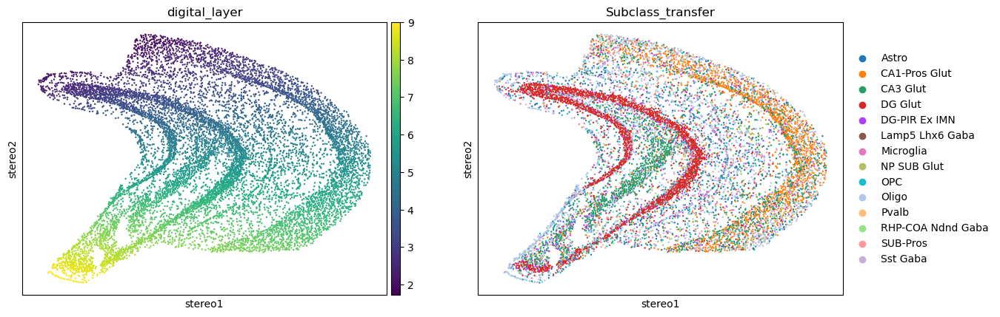

In [52]:
sc.pl.embedding(adata, basis='stereo',color=['digital_layer','Subclass_transfer'])

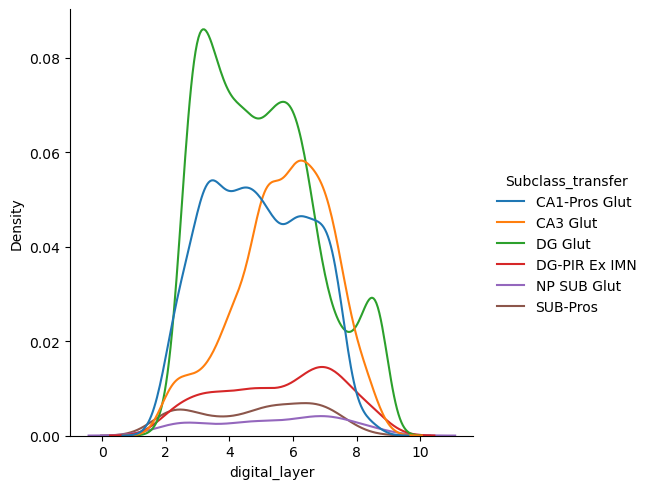

In [53]:
sns.displot(data=adata_it.obs, x='digital_layer',hue="Subclass_transfer",kind='kde')


In [54]:
adata_DG = adata[adata.obs['Subclass_transfer']=='DG Glut']

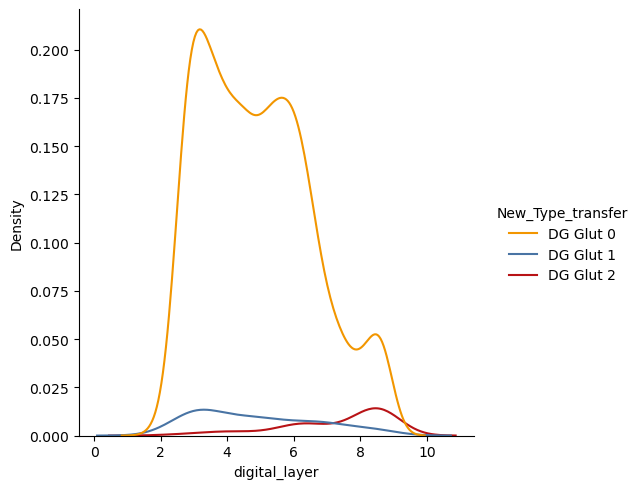

In [55]:
sns.displot(data=adata_DG.obs, x="digital_layer",hue="New_Type_transfer",kind='kde',palette=["#f29600","#4974a4","#b81316"])


/root/anaconda3/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:435: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/root/anaconda3/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:437: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/root/anaconda3/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:440: PerformanceWarning: DataFrame is highly fragmented.  This is usu

Marker genes for Astro:
['Malat1' 'Apoe' 'Slc1a2' 'Atp1a2' 'Aldoc' 'Mt1' 'Slc1a3' 'Lsamp' 'Cst3'
 'Gpc5' 'Clu' 'Glul' 'Nrxn1' 'Bcan' 'Mt2' 'Ntm' 'Msi2' 'Gm3764' 'Plpp3'
 'Htra1']
Marker genes for CA1-Pros Glut 0:
['Snhg11' 'Calm2' 'Tmsb4x' 'Gh' 'Atp1b1' 'Meg3' 'Nrgn' 'Prkcb' 'Atp2b1'
 'Rasgrp1' 'Cpe' 'Rtn1' 'Tspan13' 'Cpne7' 'Hspa8' 'Calm1' 'Crym' 'Gria2'
 'Fkbp1a' 'Nov']
Marker genes for CA1-Pros Glut 1:
['Gh' 'Cpe' 'Atp1b1' 'Snhg11' 'Calm2' 'Nnat' 'Crym' 'Stmn3' 'Hspa8'
 'Tmsb4x' 'Nrgn' 'Snap25' 'Rab3c' 'Meg3' 'Hsp90aa1' 'Rtn1' 'Hsp90ab1'
 'Aldoa' 'Tuba1a' 'Fibcd1']
Marker genes for CA3 Glut 0:
['Kifap3' 'Pafah1b1' 'Camk2a' 'Ksr1' 'Rps27' 'Prdx5' 'Dst' 'Slirp'
 'Gm32647' 'Srsf5' 'Nrgn' 'Lrrn1' 'Osbpl1a' 'Trhr' 'Oaz1' 'Rasal1'
 'Atp1a3' 'Errfi1' 'Auts2' 'Kcnip4']
Marker genes for CA3 Glut 1:
['Hpca' 'Cpe' 'Snap25' 'Cck' 'Nrgn' 'Itm2c' 'Gnas' 'Uchl1' 'Snca' 'Cpne7'
 'Syn2' 'Ywhah' 'Nptxr' 'Chgb' 'Olfm1' 'Gh' 'Stmn2' 'Nnat' 'Crym'
 'Selenow']
Marker genes for CA3 Glut 2:
['Meg3' 'Cdk8' 

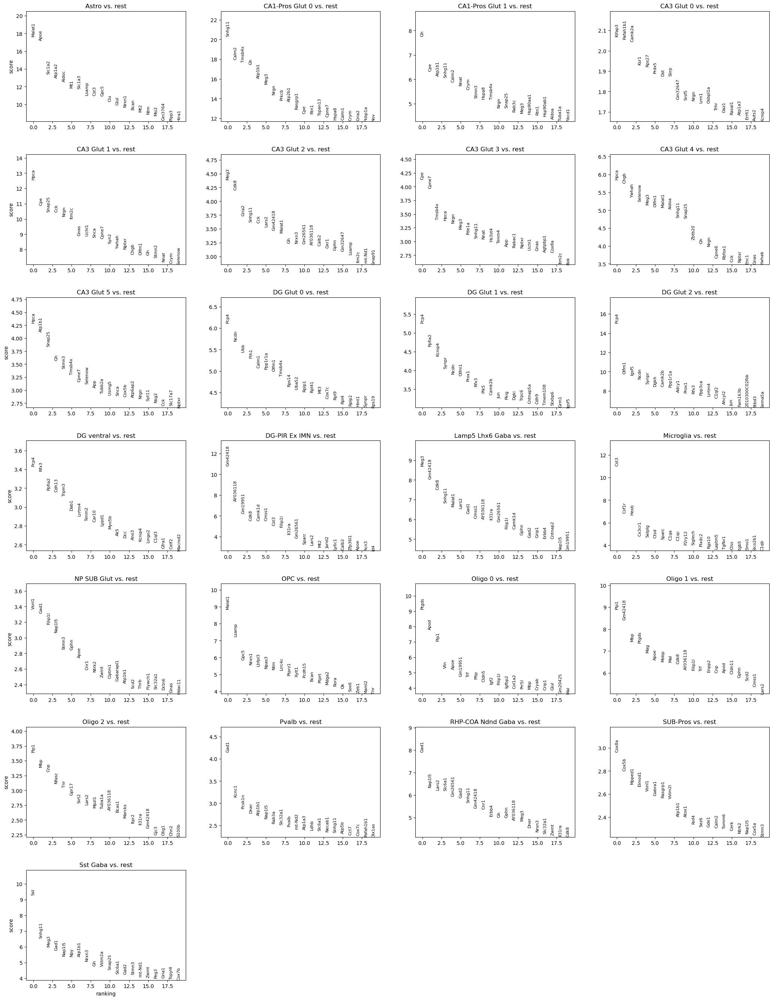

In [79]:
import scanpy as sc

# 假设 adata 是你的 AnnData 对象，'Type' 是细胞类型的列
# Step 1: 进行差异表达分析
sc.tl.rank_genes_groups(adata, groupby='Type_transfer', method='t-test', n_genes=20)

# Step 2: 查看每个 Type 的 marker 基因
# 查看每个 Type 最显著的基因
marker_genes = adata.uns['rank_genes_groups']['names']
for type_name in adata.obs['Type_transfer'].cat.categories:
    print(f"Marker genes for {type_name}:")
    print(marker_genes[type_name])

# Step 3: 可视化显著的 marker 基因
# 你可以选择 top N 个基因进行可视化
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)


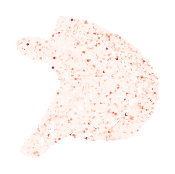

In [56]:
# 确定目标基因
target_gene = 'Fibcd1'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

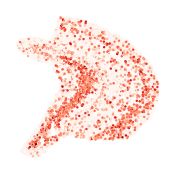

In [57]:
# 确定目标基因
target_gene = 'Il16'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

In [12]:
adata_DG = adata[adata.obs['Subclass_transfer']=='DG Glut']

In [15]:
adata_DGp = adata_DG[adata_DG.obs['digital_column'].between(4, 10)]

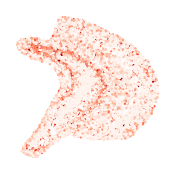

In [58]:
# 确定目标基因
target_gene = 'Prox1'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x, y, c=gene_expression_zscore, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

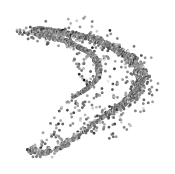

In [124]:
# 确定目标基因
target_gene = 'Prox1'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取整体坐标信息
    x_all = adata.obs['coor_x_ad']
    y_all = adata.obs['coor_y_ad']
    
    # 获取整体基因表达数据并进行标准化（Z-score）
    gene_expression_all = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore_all = zscore(gene_expression_all)
    
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized_all = (
        (gene_expression_zscore_all - gene_expression_zscore_all.min()) / 
        (gene_expression_zscore_all.max() - gene_expression_zscore_all.min())
    )
    
    # 将归一化的基因表达数据添加到 `adata.obs` 中便于筛选
    adata.obs['gene_expression_normalized'] = gene_expression_normalized_all
    
    # 筛选满足条件的细胞
    filtered_adata = adata[
        (adata.obs['digital_column'].between(4, 10)) & 
        (adata.obs['Subclass_transfer'] == 'DG Glut')
    ]
    
    # 获取筛选后的坐标信息和基因表达
    x_filtered = filtered_adata.obs['coor_x_ad']
    y_filtered = filtered_adata.obs['coor_y_ad']
    gene_expression_filtered = filtered_adata.obs['gene_expression_normalized']
    
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x_filtered, y_filtered, c=gene_expression_filtered, cmap='Greys', s=1)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")


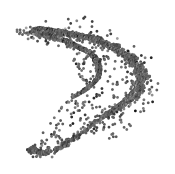

In [125]:
# 确定目标基因
target_gene = 'Kctd16'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取整体坐标信息
    x_all = adata.obs['coor_x_ad']
    y_all = adata.obs['coor_y_ad']
    
    # 获取整体基因表达数据并进行标准化（Z-score）
    gene_expression_all = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore_all = zscore(gene_expression_all)
    
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized_all = (
        (gene_expression_zscore_all - gene_expression_zscore_all.min()) / 
        (gene_expression_zscore_all.max() - gene_expression_zscore_all.min())
    )
    
    # 将归一化的基因表达数据添加到 `adata.obs` 中便于筛选
    adata.obs['gene_expression_normalized'] = gene_expression_normalized_all
    
    # 筛选满足条件的细胞
    filtered_adata = adata[
        (adata.obs['digital_column'].between(4, 10)) & 
        (adata.obs['Subclass_transfer'] == 'DG Glut')
    ]
    
    # 获取筛选后的坐标信息和基因表达
    x_filtered = filtered_adata.obs['coor_x_ad']
    y_filtered = filtered_adata.obs['coor_y_ad']
    gene_expression_filtered = filtered_adata.obs['gene_expression_normalized']
    
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x_filtered, y_filtered, c=gene_expression_filtered, cmap='Greys', s=1)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")


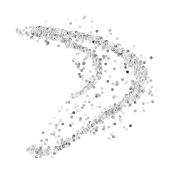

In [126]:
# 确定目标基因
target_gene = 'Mapk4'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取整体坐标信息
    x_all = adata.obs['coor_x_ad']
    y_all = adata.obs['coor_y_ad']
    
    # 获取整体基因表达数据并进行标准化（Z-score）
    gene_expression_all = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore_all = zscore(gene_expression_all)
    
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized_all = (
        (gene_expression_zscore_all - gene_expression_zscore_all.min()) / 
        (gene_expression_zscore_all.max() - gene_expression_zscore_all.min())
    )
    
    # 将归一化的基因表达数据添加到 `adata.obs` 中便于筛选
    adata.obs['gene_expression_normalized'] = gene_expression_normalized_all
    
    # 筛选满足条件的细胞
    filtered_adata = adata[
        (adata.obs['digital_column'].between(4, 10)) & 
        (adata.obs['Subclass_transfer'] == 'DG Glut')
    ]
    
    # 获取筛选后的坐标信息和基因表达
    x_filtered = filtered_adata.obs['coor_x_ad']
    y_filtered = filtered_adata.obs['coor_y_ad']
    gene_expression_filtered = filtered_adata.obs['gene_expression_normalized']
    
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x_filtered, y_filtered, c=gene_expression_filtered, cmap='Greys', s=1)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")


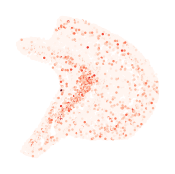

In [127]:
# 确定目标基因
target_gene = 'Iyd'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x, y, c=gene_expression_zscore, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

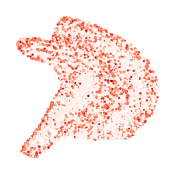

In [128]:
# 确定目标基因
target_gene = 'Gatm'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x, y, c=gene_expression_zscore, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

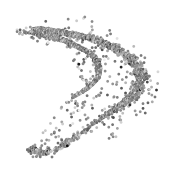

In [22]:
# 确定目标基因
target_gene = 'Prox1'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata_DGp.var_names:
    # 获取坐标信息
    x = adata_DGp.obs['coor_x_ad']
    y = adata_DGp.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata_DGp[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Greys', s=1)
    #plt.colorbar(label= 'Expression (Z-score)')
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

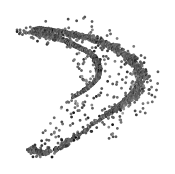

In [23]:
# 确定目标基因
target_gene = 'Kctd16'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata_DGp.var_names:
    # 获取坐标信息
    x = adata_DGp.obs['coor_x_ad']
    y = adata_DGp.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata_DGp[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Greys', s=1)
    #plt.colorbar(label= 'Expression (Z-score)')
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

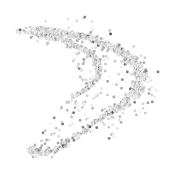

In [24]:
# 确定目标基因
target_gene = 'Mapk4'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata_DGp.var_names:
    # 获取坐标信息
    x = adata_DGp.obs['coor_x_ad']
    y = adata_DGp.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata_DGp[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Greys', s=1)
    #plt.colorbar(label= 'Expression (Z-score)')
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

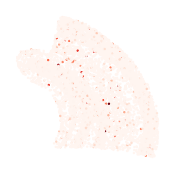

In [112]:
# 确定目标基因
target_gene = 'Mex3a'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

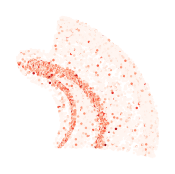

In [150]:
# 确定目标基因
target_gene = 'Ntf3'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

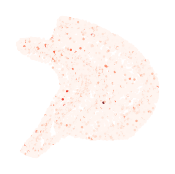

In [129]:
# 确定目标基因
target_gene = 'Neurod1'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

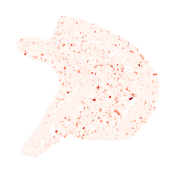

In [74]:
# 确定目标基因
target_gene = 'Rgs12'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

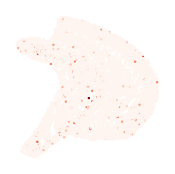

In [81]:
# 确定目标基因
target_gene = 'Ramp3'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

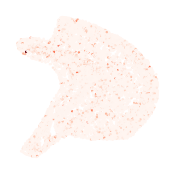

In [130]:
# 确定目标基因
target_gene = 'C1ql2'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

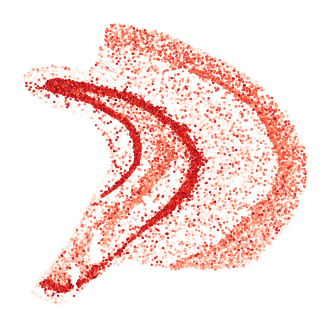

In [83]:
# 确定目标基因
target_gene = 'Epha7'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(4, 4))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

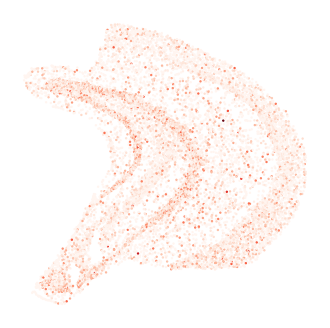

In [84]:
# 确定目标基因
target_gene = 'Atp2b4'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(4, 4))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

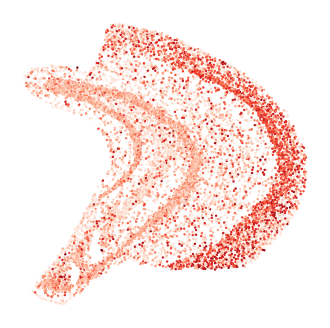

In [11]:
# 确定目标基因
target_gene = 'Nrg1'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(4, 4))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

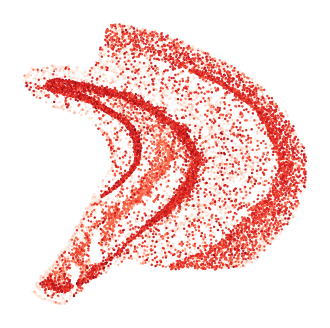

In [85]:
# 确定目标基因
target_gene = 'Kctd16'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(4, 4))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

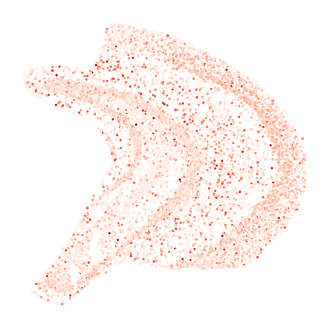

In [16]:
# 确定目标基因
target_gene = 'Mapk4'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(4, 4))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

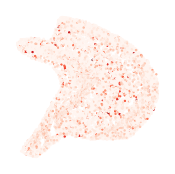

In [76]:
# 确定目标基因
target_gene = 'Fam107a'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    #plt.colorbar(label= 'Expression (Z-score)')
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

In [17]:
# 确定目标基因
target_gene = 'Ten-m3'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    #plt.colorbar(label= 'Expression (Z-score)')
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

Ten-m3 不存在于数据中，请检查基因名称。


In [11]:
# 确定目标基因
target_gene = 'Lphn2'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    #plt.colorbar(label= 'Expression (Z-score)')
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

Lphn2 不存在于数据中，请检查基因名称。


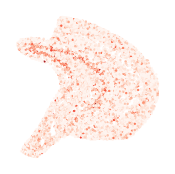

In [80]:
# 确定目标基因
target_gene = 'Pcp4'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    #plt.colorbar(label= 'Expression (Z-score)')
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

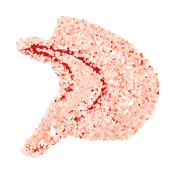

In [81]:
# 确定目标基因
target_gene = 'Rfx3'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    #plt.colorbar(label= 'Expression (Z-score)')
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

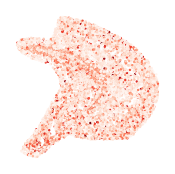

In [82]:
# 确定目标基因
target_gene = 'Cdh13'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(2, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    #plt.colorbar(label= 'Expression (Z-score)')
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")